In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pandas import Series
from matplotlib import pyplot


df0 = pd.read_csv('Guasave.txt', sep='\s+')
df0

,FECHA,PRECIP,EVAP,TMAX,TMIN
0,16/01/1969,0.0,3.2,26.0,13.5
1,17/01/1969,0.0,2.6,27.0,13.0
2,18/01/1969,0.0,0.5,26.0,11.5
3,19/01/1969,0.0,5.1,25.0,11.5
4,20/01/1969,0.0,3.5,29.0,10.5
5,21/01/1969,0.0,2,29.0,9.5
6,22/01/1969,0.0,3,28.5,11.0
7,23/01/1969,0.0,2.8,27.5,11.0
8,24/01/1969,0.0,3.9,29.0,10.0
9,25/01/1969,0.0,2.5,29.0,10.0


In [2]:
#Creando un DataFrame para mejor manejo de datos
df = pd.DataFrame(df0)
df

,FECHA,PRECIP,EVAP,TMAX,TMIN
0,16/01/1969,0.0,3.2,26.0,13.5
1,17/01/1969,0.0,2.6,27.0,13.0
2,18/01/1969,0.0,0.5,26.0,11.5
3,19/01/1969,0.0,5.1,25.0,11.5
4,20/01/1969,0.0,3.5,29.0,10.5
5,21/01/1969,0.0,2,29.0,9.5
6,22/01/1969,0.0,3,28.5,11.0
7,23/01/1969,0.0,2.8,27.5,11.0
8,24/01/1969,0.0,3.9,29.0,10.0
9,25/01/1969,0.0,2.5,29.0,10.0


In [3]:
#   Se crean dos columna nuevas haciendo uso de la columna de FECHA
#Se crea una con el número del mes y otra con el año
#al final se borra la columna de fecha ya que es innecesaria
df["FECHAS"]=pd.to_datetime(df['FECHA'], format='%d/%m/%Y')
df = df.drop('FECHA', 1)
df['Mes'] = df['FECHAS'].dt.month
df['Año'] = df['FECHAS'].dt.year
df.head(), df.tail()

(   PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
 0     0.0  3.2  26.0  13.5 1969-01-16    1  1969
 1     0.0  2.6  27.0  13.0 1969-01-17    1  1969
 2     0.0  0.5  26.0  11.5 1969-01-18    1  1969
 3     0.0  5.1  25.0  11.5 1969-01-19    1  1969
 4     0.0  3.5  29.0  10.5 1969-01-20    1  1969,
       PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
 4171     0.0  1.5  27.5  10.0 1985-12-27   12  1985
 4172     0.0  2.9  28.0  10.0 1985-12-28   12  1985
 4173     0.0  4.6  28.5  11.5 1985-12-29   12  1985
 4174     0.0  3.6  30.0  11.5 1985-12-30   12  1985
 4175     0.0  1.4  30.0  10.0 1985-12-31   12  1985)

In [4]:
#     Aquí se calcula la cantidad de días con heladas
#(con temperatura mínima menor a 0°C), haciendo uso de un for
#anidado

FD = []
diasHel = 0
año = [] 
for i in range(1969, 1985):
    for l in range(0, len(df)):
        if( df["Año"][l] == i and df["TMIN"][l] < 0):
            diasHel = diasHel + 1
    FD.append(diasHel)
    año.append(i)
    diasHel = 0

In [5]:
FD, año

([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
 [1969,
  1970,
  1971,
  1972,
  1973,
  1974,
  1975,
  1976,
  1977,
  1978,
  1979,
  1980,
  1981,
  1982,
  1983,
  1984])

In [6]:
#Tabla1 = [año, FD]
#Se crea un DataFrame (MNS) con la función de pandas pd.DataFrame
#La columna "Año" contiene los datos de la lista año
#     la columna "Días Bajo 0" contiene los días por año que estuvieron
#bajo cero grados centigrados
#     index sirve como índice, en este caso quiero que vaya desde 0 hasta
#la longitud de la lista de año
MNS = pd.DataFrame(
    {"Año" : año,
     "Días Bajo 0°C" : FD},
    index = range(0, len(año))
    )
MNS

,Año,Días Bajo 0°C
0,1969,0
1,1970,0
2,1971,0
3,1972,0
4,1973,0
5,1974,0
6,1975,0
7,1976,0
8,1977,0
9,1978,0


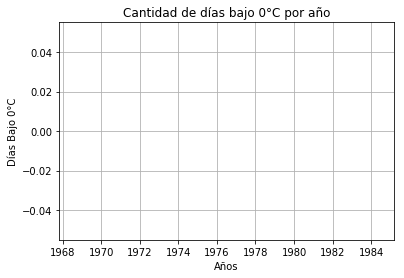

In [7]:
#Se grafica "Cantidad de días bajo 0°C por año"

fig, ax = plt.subplots()
plt.bar(MNS["Año"], MNS["Días Bajo 0°C"])
plt.grid(True)
ax.set_ylabel('Días Bajo 0°C')
ax.set_title('Cantidad de días bajo 0°C por año')
ax.set_xlabel('Años')
plt.show()

In [8]:
#     Se consigue el número de días de vernao 
#(días con temperatura máxima mayora 25°C)

SU = []
diasv = 0
año = []
for i in range(1969, 1985):
    for j in range(0, len(df)):
        if(df["Año"][j] == i and (df["TMAX"][j] > 25)):
           diasv = diasv + 1
    SU.append(diasv)
    año.append(i)
    diasv = 0

In [9]:
SU

[274, 0, 186, 0, 283, 339, 336, 223, 105, 0, 184, 264, 333, 346, 340, 332]

In [10]:
año

[1969,
 1970,
 1971,
 1972,
 1973,
 1974,
 1975,
 1976,
 1977,
 1978,
 1979,
 1980,
 1981,
 1982,
 1983,
 1984]

In [11]:
#     Se crea un DatFrame 

DDV = pd.DataFrame(
    {"Año" : año,
    "Días de temperatura máxima mayor a 25°C": SU},
    index =range(0, len(año))
    )

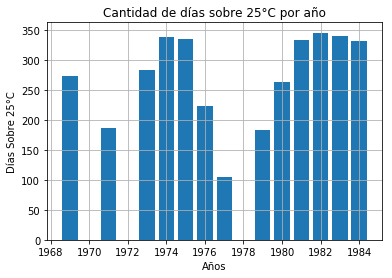

In [12]:
fig, ax = plt.subplots()
plt.bar(DDV["Año"], DDV["Días de temperatura máxima mayor a 25°C"])
plt.grid(True)
ax.set_ylabel('Días Sobre 25°C')
ax.set_title('Cantidad de días sobre 25°C por año')
ax.set_xlabel('Años')
plt.show()

In [13]:
TR = []
diasTR = 0
año = []
for i in range(1969, 1985):
    for j in range(0, len(df)):
        if(df["Año"][j] == i and (df["TMIN"][j] > 20)):
           diasTR = diasTR + 1
    TR.append(diasTR)
    año.append(i)
    diasTR = 0

In [14]:
TR, año

([113, 0, 41, 0, 113, 131, 119, 118, 0, 0, 115, 45, 137, 128, 150, 140],
 [1969,
  1970,
  1971,
  1972,
  1973,
  1974,
  1975,
  1976,
  1977,
  1978,
  1979,
  1980,
  1981,
  1982,
  1983,
  1984])

In [15]:
DTR = pd.DataFrame(
    {"Año" : año,
    "Días Tropicales": TR},
    index =range(0, len(año))
    )

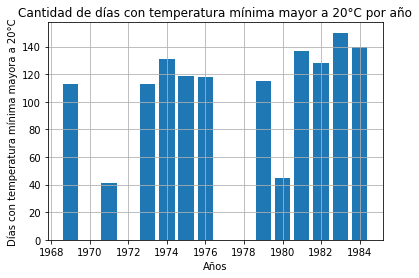

In [16]:
fig, ax = plt.subplots()
plt.bar(DTR["Año"], DTR["Días Tropicales"])
plt.grid(True)
ax.set_ylabel('Días con temperatura mínima mayora a 20°C')
ax.set_title('Cantidad de días con temperatura mínima mayor a 20°C por año')
ax.set_xlabel('Años')
plt.show()

In [17]:
# La máxima mensual de la temperatura máxima, max(Tmax).

tmp = 0
Tmp = 0
mes = []
for k in range(1969, 1984):
    for i in range(1, 13):
        for j in range(0, len(df)):
            tmp = df["TMAX"][j] 
            if((df["Mes"][j] == i and df["Año"][j] == k) and (df["TMAX"][j+1] > tmp)):
                Tmp = df["TMAX"][j+1]
        if (Tmp != 0):        
            mes.append(Tmp)
        else:
            mes.append(None)
        


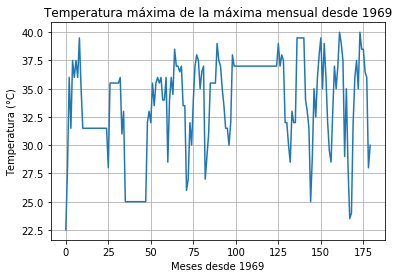

In [18]:
plt.plot(range(0, len(mes)), mes)
plt.grid(True)
plt.ylabel("Temperatura (°C)")
plt.xlabel("Meses desde 1969")
plt.title("Temperatura máxima de la máxima mensual desde 1969")
plt.show()

In [19]:
#     Temperatura máxima mensual de la temperatura mínima
tMm = 0
TMm = 0
mesMm = []
for k in range(1969, 1984):
    for i in range(1, 13):
        for j in range(0, len(df)):
            tMm = df["TMIN"][j] 
            if((df["Mes"][j] == i and df["Año"][j] == k) and (df["TMIN"][j+1] > tMm)):
                TMm = df["TMIN"][j+1]
        mesMm.append(TMm)


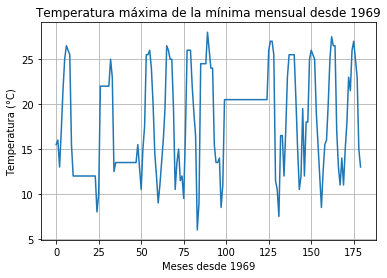

In [20]:
plt.plot(range(0, len(mesMm)), mesMm)
plt.grid(True)
plt.ylabel("Temperatura (°C)")
plt.xlabel("Meses desde 1969")
plt.title("Temperatura máxima de la mínima mensual desde 1969")
plt.show()

In [21]:
#     Temperatura mínima mensual de la máxima
tmM = 0
TmM = 0
mesmM = []
for k in range(1969, 1984):
    for i in range(1, 13):
        for j in range(0, len(df)):
            tmM = df["TMAX"][j] 
            if((df["Mes"][j] == i and df["Año"][j] == k) and (df["TMAX"][j+1] < tmM)):
                TmM = df["TMAX"][j+1]
        mesmM.append(TmM)

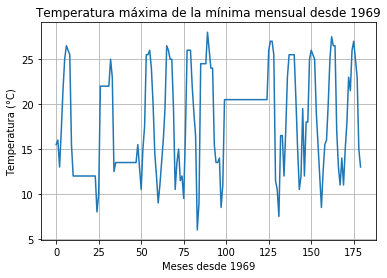

In [22]:
plt.plot(range(0, len(mesMm)), mesMm)
plt.grid(True)
plt.ylabel("Temperatura (°C)")
plt.xlabel("Meses desde 1969")
plt.title("Temperatura máxima de la mínima mensual desde 1969")
plt.show()

In [23]:
#     Temperatura mínima mensual de la temperatura mínima
tmm = 0
Tmm = 0
mesmm = []
for k in range(1969, 1984):
    for i in range(1, 13):
        for j in range(0, len(df)):
            tmm = df["TMAX"][j] 
            if((df["Mes"][j] == i and df["Año"][j] == k) and (df["TMAX"][j+1] < tmm)):
                Tmm = df["TMAX"][j+1]
        mesmm.append(Tmm)

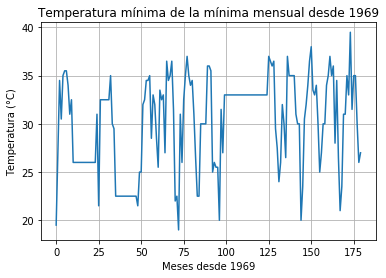

In [24]:
plt.plot(range(0, len(mesmm)), mesmm)
plt.grid(True)
plt.ylabel("Temperatura (°C)")
plt.xlabel("Meses desde 1969")
plt.title("Temperatura mínima de la mínima mensual desde 1969")
plt.show()

In [25]:
#DTR: El promedio mensual de la diferencia de temperaturas (Tmax-Tmin). 
x = 0
m = 0
Prom = 0
promV = []
for k in range(1969, 1984):
    for i in range(1, 13):
        for j in range(0, len(df)):
            if((df["Mes"][j] == i and df["Año"][j] == k)):
                x = (df["TMAX"][j]-df["TMIN"][j]) + x
                m = m + 1
             #   print( x, m, x/m)
        if (m == 0):
            Prom = None
            promV.append(Prom)
        else:
            Prom = x/m        
            promV.append(Prom)
            m = 0
            x = 0

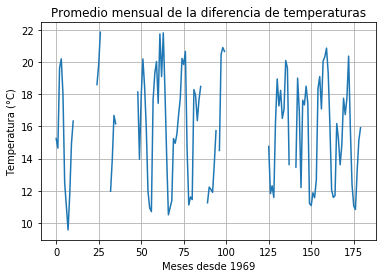

In [26]:
plt.plot(range(0, len(promV)), promV)
plt.grid(True)
plt.ylabel("Temperatura (°C)")
plt.xlabel("Meses desde 1969")
plt.title("Promedio mensual de la diferencia de temperaturas")
plt.show()

In [37]:
#     Precipitación diaria máxima mensual en un día
# agarra un mes, checa la precipitación de cada día, la mayor precipitación
# será la que correspona para dicho mes
#precip = -100
PRECIP = 0
pitacion = []
for k  in range(1969, 1984):
    for i in range(1, 13):
            for j in range(0, len(df)):
                if((df["Mes"][j] == i and df["Año"][j] == k) and (df["PRECIP"][j]) > PRECIP):
                    PRECIP = df["PRECIP"][j]
                   # print(PRECI)
            if(PRECIP != 0):
                #print(PRECI)
                pitacion.append(PRECIP)
                PRECIP = 0
            else:
                pitacion.append(PRECIP)
                PRECIP = 0

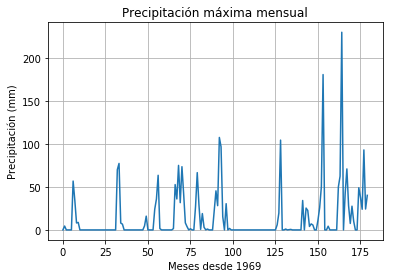

In [57]:
#plt.figure(figsize = (10, 10))
plt.plot(range(0, len(pitacion)), pitacion)

plt.grid(True)
plt.ylabel("Precipitación (mm)")
plt.xlabel("Meses desde 1969")
plt.title("Precipitación máxima mensual")
plt.show()

In [39]:
#     Precipiación diaria máxima mensual en 5 días consecutivos

PRc = 0
pc = []
for k  in range(1969, 1984):
    for i in range(1, 13):
            for j in range(0, len(df)):
                if((df["Mes"][j] == i and df["Año"][j] == k) and (df["PRECIP"][j] + df["PRECIP"][j+1] + df["PRECIP"][j + 2] + df["PRECIP"][j + 3] + df["PRECIP"][j + 4]) > PRc):
                    PRc = df["PRECIP"][j]  + df["PRECIP"][j+1] + df["PRECIP"][j + 2] + df["PRECIP"][j + 3] + df["PRECIP"][j + 4]
                   # print(PRECI)
            if(PRc != 0):
                #print(PRECI)
                pc.append(PRc)
                PRc = 0
            else:
                pc.append(PRc)
                PRc = 0

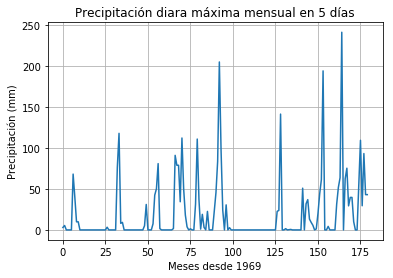

In [56]:
plt.plot(range(0, len(pc)), pc)
plt.grid(True)
plt.title("Precipitación diara máxima mensual en 5 días")
plt.ylabel("Precipitación (mm)")
plt.xlabel("Meses desde 1969")
plt.show()

In [ ]:
#SDII: Número de días en un año con precipitación mayor igual a 1mm.


for i in range(1969, 1984):
    año = df[df["Año"] == i]
    for j in range(1, 13):
        mes = año[año["Mes"] == j]
        for k in mes.index:
          print(mes)
          print(año)

    PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
0      0.0  3.2  26.0  13.5 1969-01-16    1  1969
1      0.0  2.6  27.0  13.0 1969-01-17    1  1969
2      0.0  0.5  26.0  11.5 1969-01-18    1  1969
3      0.0  5.1  25.0  11.5 1969-01-19    1  1969
4      0.0  3.5  29.0  10.5 1969-01-20    1  1969
5      0.0    2  29.0   9.5 1969-01-21    1  1969
6      0.0    3  28.5  11.0 1969-01-22    1  1969
7      0.0  2.8  27.5  11.0 1969-01-23    1  1969
8      0.0  3.9  29.0  10.0 1969-01-24    1  1969
9      0.0  2.5  29.0  10.0 1969-01-25    1  1969
10     0.0  2.8  32.0  10.5 1969-01-26    1  1969
11     0.0    2  29.0  11.5 1969-01-27    1  1969
12     0.0  3.4  29.0  13.5 1969-01-28    1  1969
13     0.0  5.7  25.0  15.5 1969-01-29    1  1969
14     0.0  0.9  24.5  14.5 1969-01-30    1  1969
15     0.0  3.7  19.5  14.0 1969-01-31    1  1969
     PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
0       0.0  3.2  26.0  13.5 1969-01-16    1  1969
1       0.0  2.6  27.0  13.0 1969-01-17    1  19

42     0.0  4.5  27.0  13.5 1969-02-28    2  1969
     PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
0       0.0  3.2  26.0  13.5 1969-01-16    1  1969
1       0.0  2.6  27.0  13.0 1969-01-17    1  1969
2       0.0  0.5  26.0  11.5 1969-01-18    1  1969
3       0.0  5.1  25.0  11.5 1969-01-19    1  1969
4       0.0  3.5  29.0  10.5 1969-01-20    1  1969
5       0.0    2  29.0   9.5 1969-01-21    1  1969
6       0.0    3  28.5  11.0 1969-01-22    1  1969
7       0.0  2.8  27.5  11.0 1969-01-23    1  1969
8       0.0  3.9  29.0  10.0 1969-01-24    1  1969
9       0.0  2.5  29.0  10.0 1969-01-25    1  1969
10      0.0  2.8  32.0  10.5 1969-01-26    1  1969
11      0.0    2  29.0  11.5 1969-01-27    1  1969
12      0.0  3.4  29.0  13.5 1969-01-28    1  1969
13      0.0  5.7  25.0  15.5 1969-01-29    1  1969
14      0.0  0.9  24.5  14.5 1969-01-30    1  1969
15      0.0  3.7  19.5  14.0 1969-01-31    1  1969
16      0.0  5.2  22.5  12.5 1969-02-01    2  1969
17      0.0  1.8  24.0   9.0 196

     PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
0       0.0  3.2  26.0  13.5 1969-01-16    1  1969
1       0.0  2.6  27.0  13.0 1969-01-17    1  1969
2       0.0  0.5  26.0  11.5 1969-01-18    1  1969
3       0.0  5.1  25.0  11.5 1969-01-19    1  1969
4       0.0  3.5  29.0  10.5 1969-01-20    1  1969
5       0.0    2  29.0   9.5 1969-01-21    1  1969
6       0.0    3  28.5  11.0 1969-01-22    1  1969
7       0.0  2.8  27.5  11.0 1969-01-23    1  1969
8       0.0  3.9  29.0  10.0 1969-01-24    1  1969
9       0.0  2.5  29.0  10.0 1969-01-25    1  1969
10      0.0  2.8  32.0  10.5 1969-01-26    1  1969
11      0.0    2  29.0  11.5 1969-01-27    1  1969
12      0.0  3.4  29.0  13.5 1969-01-28    1  1969
13      0.0  5.7  25.0  15.5 1969-01-29    1  1969
14      0.0  0.9  24.5  14.5 1969-01-30    1  1969
15      0.0  3.7  19.5  14.0 1969-01-31    1  1969
16      0.0  5.2  22.5  12.5 1969-02-01    2  1969
17      0.0  1.8  24.0   9.0 1969-02-02    2  1969
18      3.0    2  23.0   9.0 19

    PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
43     0.0  4.3  28.0  16.0 1969-03-01    3  1969
44     0.0  4.7  27.0  12.5 1969-03-02    3  1969
45     0.0  4.2  29.5  10.0 1969-03-03    3  1969
46     0.0  4.6  26.5   7.5 1969-03-04    3  1969
47     0.0  3.8  24.0   8.5 1969-03-05    3  1969
48     0.0  4.7  27.0   4.5 1969-03-06    3  1969
49     0.0  2.6  26.0   8.5 1969-03-07    3  1969
50     0.0  6.4  26.5   8.5 1969-03-08    3  1969
51     0.0  4.4  27.0  11.0 1969-03-09    3  1969
52     0.0    3  25.0   9.5 1969-03-10    3  1969
53     0.0  4.3  26.0  10.0 1969-03-11    3  1969
54     0.0  4.9  27.5   9.0 1969-03-12    3  1969
55     0.0  2.5  24.0  11.5 1969-03-13    3  1969
56     0.0  4.3  22.5  12.0 1969-03-14    3  1969
57     0.0  4.6  22.5   6.5 1969-03-15    3  1969
58     0.0  6.3  25.5   6.5 1969-03-16    3  1969
59     0.0  5.7  31.0  10.0 1969-03-17    3  1969
60     0.0  5.2  33.5   8.0 1969-03-18    3  1969
61     0.0  6.2  34.5   8.0 1969-03-19    3  1969


     PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
74      0.0  6.3  34.5  12.0 1969-04-01    4  1969
75      0.0  4.9  33.0  12.0 1969-04-02    4  1969
76      0.0  3.9  31.5  17.0 1969-04-03    4  1969
77      0.0  7.3  34.5  15.0 1969-04-04    4  1969
78      0.0  6.5  35.5  15.5 1969-04-05    4  1969
79      0.0  8.2  36.0  12.0 1969-04-06    4  1969
80      0.0  4.9  35.5  11.5 1969-04-07    4  1969
81      0.0  6.3  34.0  14.0 1969-04-08    4  1969
82      0.0  5.7  33.0  17.0 1969-04-09    4  1969
83      0.0  5.8  34.0  12.0 1969-04-10    4  1969
84      0.0  7.5  31.0  13.5 1969-04-11    4  1969
85      0.0  6.6  32.0  10.5 1969-04-12    4  1969
86      0.0  5.3  32.5  13.0 1969-04-13    4  1969
87      0.0  5.6  33.0  14.0 1969-04-14    4  1969
88      0.0  3.8  31.5  15.0 1969-04-15    4  1969
89      0.0  6.6  30.5  14.5 1969-04-16    4  1969
90      0.0  7.9  31.5  13.5 1969-04-17    4  1969
91      0.0    5  34.0  12.0 1969-04-18    4  1969
92      0.0  7.8  34.0  10.0 19

134     0.0  6.5  35.5  20.5 1969-05-31    5  1969
     PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
0       0.0  3.2  26.0  13.5 1969-01-16    1  1969
1       0.0  2.6  27.0  13.0 1969-01-17    1  1969
2       0.0  0.5  26.0  11.5 1969-01-18    1  1969
3       0.0  5.1  25.0  11.5 1969-01-19    1  1969
4       0.0  3.5  29.0  10.5 1969-01-20    1  1969
5       0.0    2  29.0   9.5 1969-01-21    1  1969
6       0.0    3  28.5  11.0 1969-01-22    1  1969
7       0.0  2.8  27.5  11.0 1969-01-23    1  1969
8       0.0  3.9  29.0  10.0 1969-01-24    1  1969
9       0.0  2.5  29.0  10.0 1969-01-25    1  1969
10      0.0  2.8  32.0  10.5 1969-01-26    1  1969
11      0.0    2  29.0  11.5 1969-01-27    1  1969
12      0.0  3.4  29.0  13.5 1969-01-28    1  1969
13      0.0  5.7  25.0  15.5 1969-01-29    1  1969
14      0.0  0.9  24.5  14.5 1969-01-30    1  1969
15      0.0  3.7  19.5  14.0 1969-01-31    1  1969
16      0.0  5.2  22.5  12.5 1969-02-01    2  1969
17      0.0  1.8  24.0   9.0 19

[294 rows x 7 columns]
     PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
135     0.0  8.4  35.0  19.0 1969-06-01    6  1969
136     0.0  7.7  32.0  14.0 1969-06-02    6  1969
137     0.0  6.1  33.5  14.0 1969-06-03    6  1969
138     0.0  6.7  33.0  16.0 1969-06-08    6  1969
139     0.0  5.7  34.5  24.5 1969-06-09    6  1969
140     0.0  6.8  33.5  25.0 1969-06-10    6  1969
141     0.0  6.8  32.5  20.0 1969-06-11    6  1969
142     0.0  6.8  35.0  19.0 1969-06-12    6  1969
143     0.0  6.4  34.5  19.0 1969-06-15    6  1969
144     0.0  6.8  34.0  21.0 1969-06-16    6  1969
145     0.0    2  32.0  12.5 1969-06-17    6  1969
146     0.0    4  32.0  21.0 1969-06-18    6  1969
147     0.0    4  31.5  21.0 1969-06-19    6  1969
148     0.0  1.5  33.0  24.5 1969-06-20    6  1969
149     0.0  5.8  33.0  26.0 1969-06-21    6  1969
150     0.0  8.2  34.5  24.0 1969-06-22    6  1969
151     0.0  8.2  35.0  24.0 1969-06-23    6  1969
152     0.0  7.4  32.0  23.5 1969-06-24    6  1969
153     

     PRECIP  EVAP  TMAX  TMIN     FECHAS  Mes   Año
159     0.0   6.5  35.5  24.5 1969-07-01    7  1969
160     0.0     8  37.0  24.0 1969-07-02    7  1969
161     0.0   8.8  41.0  25.5 1969-07-03    7  1969
162     0.0   8.5  36.5  27.0 1969-07-04    7  1969
163     0.0   5.9  36.0  26.5 1969-07-05    7  1969
164     0.0   6.5  36.0  27.0 1969-07-06    7  1969
165     0.0   6.6  37.0  26.5 1969-07-07    7  1969
166     0.0     3  33.0  25.0 1969-07-08    7  1969
167     0.0     6  36.0  25.5 1969-07-09    7  1969
168     0.0   6.3  36.0  24.0 1969-07-10    7  1969
169     1.4  10.6  35.0  24.0 1969-07-11    7  1969
170     3.6   4.5  37.0  26.5 1969-07-12    7  1969
171    26.8   6.7  35.0  26.0 1969-07-13    7  1969
172     0.3   1.8  37.0  24.5 1969-07-14    7  1969
173     0.0   2.3  37.0  24.0 1969-07-15    7  1969
174     0.0     7  34.5  24.0 1969-07-16    7  1969
175     0.0   5.8  34.5  25.5 1969-07-17    7  1969
176     0.0   5.9  37.0  26.5 1969-07-18    7  1969
177     0.0 

[294 rows x 7 columns]
     PRECIP  EVAP  TMAX  TMIN     FECHAS  Mes   Año
190     0.8   6.8  37.5  26.5 1969-08-01    8  1969
191     0.0   6.4  36.0  25.0 1969-08-02    8  1969
192     0.0     1  32.5  23.5 1969-08-17    8  1969
193     0.8     6  36.5  26.0 1969-08-18    8  1969
194     2.8   6.7  37.5  28.0 1969-08-19    8  1969
195     0.0   5.7  36.0  25.0 1969-08-20    8  1969
196     0.0   7.2  38.5  27.0 1969-08-21    8  1969
197    34.4  11.9  39.5  27.0 1969-08-22    8  1969
198     2.8   3.9  33.0  24.5 1969-08-23    8  1969
199     0.0   4.9  35.0  26.0 1969-08-24    8  1969
200     0.0   6.2  36.0  28.0 1969-08-25    8  1969
201     0.0   3.2  34.5  26.0 1969-08-26    8  1969
202     0.0   3.3  30.5  25.5 1969-08-27    8  1969
203     0.0   3.8  34.5  24.5 1969-08-28    8  1969
204     6.4   2.7  36.0  26.0 1969-08-29    8  1969
205     2.8   0.6  34.0  26.0 1969-08-30    8  1969
     PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
0       0.0  3.2  26.0  13.5 1969-01-16   

235     0.0  5.6  37.0  25.5 1969-09-30    9  1969
     PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
0       0.0  3.2  26.0  13.5 1969-01-16    1  1969
1       0.0  2.6  27.0  13.0 1969-01-17    1  1969
2       0.0  0.5  26.0  11.5 1969-01-18    1  1969
3       0.0  5.1  25.0  11.5 1969-01-19    1  1969
4       0.0  3.5  29.0  10.5 1969-01-20    1  1969
5       0.0    2  29.0   9.5 1969-01-21    1  1969
6       0.0    3  28.5  11.0 1969-01-22    1  1969
7       0.0  2.8  27.5  11.0 1969-01-23    1  1969
8       0.0  3.9  29.0  10.0 1969-01-24    1  1969
9       0.0  2.5  29.0  10.0 1969-01-25    1  1969
10      0.0  2.8  32.0  10.5 1969-01-26    1  1969
11      0.0    2  29.0  11.5 1969-01-27    1  1969
12      0.0  3.4  29.0  13.5 1969-01-28    1  1969
13      0.0  5.7  25.0  15.5 1969-01-29    1  1969
14      0.0  0.9  24.5  14.5 1969-01-30    1  1969
15      0.0  3.7  19.5  14.0 1969-01-31    1  1969
16      0.0  5.2  22.5  12.5 1969-02-01    2  1969
17      0.0  1.8  24.0   9.0 19

     PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
0       0.0  3.2  26.0  13.5 1969-01-16    1  1969
1       0.0  2.6  27.0  13.0 1969-01-17    1  1969
2       0.0  0.5  26.0  11.5 1969-01-18    1  1969
3       0.0  5.1  25.0  11.5 1969-01-19    1  1969
4       0.0  3.5  29.0  10.5 1969-01-20    1  1969
5       0.0    2  29.0   9.5 1969-01-21    1  1969
6       0.0    3  28.5  11.0 1969-01-22    1  1969
7       0.0  2.8  27.5  11.0 1969-01-23    1  1969
8       0.0  3.9  29.0  10.0 1969-01-24    1  1969
9       0.0  2.5  29.0  10.0 1969-01-25    1  1969
10      0.0  2.8  32.0  10.5 1969-01-26    1  1969
11      0.0    2  29.0  11.5 1969-01-27    1  1969
12      0.0  3.4  29.0  13.5 1969-01-28    1  1969
13      0.0  5.7  25.0  15.5 1969-01-29    1  1969
14      0.0  0.9  24.5  14.5 1969-01-30    1  1969
15      0.0  3.7  19.5  14.0 1969-01-31    1  1969
16      0.0  5.2  22.5  12.5 1969-02-01    2  1969
17      0.0  1.8  24.0   9.0 1969-02-02    2  1969
18      3.0    2  23.0   9.0 19

     PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
0       0.0  3.2  26.0  13.5 1969-01-16    1  1969
1       0.0  2.6  27.0  13.0 1969-01-17    1  1969
2       0.0  0.5  26.0  11.5 1969-01-18    1  1969
3       0.0  5.1  25.0  11.5 1969-01-19    1  1969
4       0.0  3.5  29.0  10.5 1969-01-20    1  1969
5       0.0    2  29.0   9.5 1969-01-21    1  1969
6       0.0    3  28.5  11.0 1969-01-22    1  1969
7       0.0  2.8  27.5  11.0 1969-01-23    1  1969
8       0.0  3.9  29.0  10.0 1969-01-24    1  1969
9       0.0  2.5  29.0  10.0 1969-01-25    1  1969
10      0.0  2.8  32.0  10.5 1969-01-26    1  1969
11      0.0    2  29.0  11.5 1969-01-27    1  1969
12      0.0  3.4  29.0  13.5 1969-01-28    1  1969
13      0.0  5.7  25.0  15.5 1969-01-29    1  1969
14      0.0  0.9  24.5  14.5 1969-01-30    1  1969
15      0.0  3.7  19.5  14.0 1969-01-31    1  1969
16      0.0  5.2  22.5  12.5 1969-02-01    2  1969
17      0.0  1.8  24.0   9.0 1969-02-02    2  1969
18      3.0    2  23.0   9.0 19

     PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
0       0.0  3.2  26.0  13.5 1969-01-16    1  1969
1       0.0  2.6  27.0  13.0 1969-01-17    1  1969
2       0.0  0.5  26.0  11.5 1969-01-18    1  1969
3       0.0  5.1  25.0  11.5 1969-01-19    1  1969
4       0.0  3.5  29.0  10.5 1969-01-20    1  1969
5       0.0    2  29.0   9.5 1969-01-21    1  1969
6       0.0    3  28.5  11.0 1969-01-22    1  1969
7       0.0  2.8  27.5  11.0 1969-01-23    1  1969
8       0.0  3.9  29.0  10.0 1969-01-24    1  1969
9       0.0  2.5  29.0  10.0 1969-01-25    1  1969
10      0.0  2.8  32.0  10.5 1969-01-26    1  1969
11      0.0    2  29.0  11.5 1969-01-27    1  1969
12      0.0  3.4  29.0  13.5 1969-01-28    1  1969
13      0.0  5.7  25.0  15.5 1969-01-29    1  1969
14      0.0  0.9  24.5  14.5 1969-01-30    1  1969
15      0.0  3.7  19.5  14.0 1969-01-31    1  1969
16      0.0  5.2  22.5  12.5 1969-02-01    2  1969
17      0.0  1.8  24.0   9.0 1969-02-02    2  1969
18      3.0    2  23.0   9.0 19

323     0.0  1.6  31.5   7.5 1971-01-31    1  1971
     PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
294     0.0  1.2  26.0   9.0 1971-01-02    1  1971
295     0.0  3.6  25.5  10.5 1971-01-03    1  1971
296     0.0  4.6  19.5  11.0 1971-01-04    1  1971
297     0.0  3.4  18.0   6.0 1971-01-05    1  1971
298     0.0  4.3  19.5   2.0 1971-01-06    1  1971
299     0.0  1.5  17.0   2.5 1971-01-07    1  1971
300     0.0  2.1  22.0   2.0 1971-01-08    1  1971
301     0.0  2.2  23.5   3.5 1971-01-09    1  1971
302     0.0  5.2  28.5   7.0 1971-01-10    1  1971
303     0.0  2.9  27.5  10.0 1971-01-11    1  1971
304     0.0  3.4  28.0  10.5 1971-01-12    1  1971
305     0.0  4.9  29.5  11.0 1971-01-13    1  1971
306     0.0    6  27.0   9.5 1971-01-14    1  1971
307     0.0  4.4  28.5   9.5 1971-01-15    1  1971
308     0.0  3.6  31.0  10.5 1971-01-16    1  1971
309     0.0  4.9  31.0  11.0 1971-01-17    1  1971
310     0.0  3.9  29.5   8.0 1971-01-18    1  1971
311     0.0  0.5  30.0   7.5 19

351     0.0  6.2  27.0  10.0 1971-02-28    2  1971
     PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
294     0.0  1.2  26.0   9.0 1971-01-02    1  1971
295     0.0  3.6  25.5  10.5 1971-01-03    1  1971
296     0.0  4.6  19.5  11.0 1971-01-04    1  1971
297     0.0  3.4  18.0   6.0 1971-01-05    1  1971
298     0.0  4.3  19.5   2.0 1971-01-06    1  1971
299     0.0  1.5  17.0   2.5 1971-01-07    1  1971
300     0.0  2.1  22.0   2.0 1971-01-08    1  1971
301     0.0  2.2  23.5   3.5 1971-01-09    1  1971
302     0.0  5.2  28.5   7.0 1971-01-10    1  1971
303     0.0  2.9  27.5  10.0 1971-01-11    1  1971
304     0.0  3.4  28.0  10.5 1971-01-12    1  1971
305     0.0  4.9  29.5  11.0 1971-01-13    1  1971
306     0.0    6  27.0   9.5 1971-01-14    1  1971
307     0.0  4.4  28.5   9.5 1971-01-15    1  1971
308     0.0  3.6  31.0  10.5 1971-01-16    1  1971
309     0.0  4.9  31.0  11.0 1971-01-17    1  1971
310     0.0  3.9  29.5   8.0 1971-01-18    1  1971
311     0.0  0.5  30.0   7.5 19

     PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
352     0.0  5.7  28.0   6.0 1971-03-01    3  1971
353     0.0  6.7  21.5   8.0 1971-03-02    3  1971
354     0.0  5.3  28.0   4.5 1971-03-03    3  1971
355     0.0  3.6  27.5   5.0 1971-03-04    3  1971
356     0.0  4.1  30.0   7.5 1971-03-05    3  1971
357     0.0  4.1  29.0   9.0 1971-03-06    3  1971
358     0.0  3.3  29.5  10.5 1971-03-07    3  1971
359     0.0  4.8  32.0   7.0 1971-03-08    3  1971
360     0.0  8.4  35.5   9.5 1971-03-09    3  1971
361     0.0  7.3  33.0  12.0 1971-03-10    3  1971
362     0.0  5.6  32.5  11.0 1971-03-11    3  1971
363     0.0  6.2  32.0   7.0 1971-03-12    3  1971
364     0.0  5.7  32.5   9.5 1971-03-13    3  1971
365     0.0  5.9  29.0   8.0 1971-03-14    3  1971
366     0.0  5.9  29.5   8.5 1971-03-15    3  1971
367     0.0  4.1  34.0   9.0 1971-03-16    3  1971
368     0.0  4.8  31.5   8.0 1971-03-17    3  1971
369     0.0  4.3  33.5   9.0 1971-03-18    3  1971
370     0.0  5.4  32.5  11.5 19

     PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
294     0.0  1.2  26.0   9.0 1971-01-02    1  1971
295     0.0  3.6  25.5  10.5 1971-01-03    1  1971
296     0.0  4.6  19.5  11.0 1971-01-04    1  1971
297     0.0  3.4  18.0   6.0 1971-01-05    1  1971
298     0.0  4.3  19.5   2.0 1971-01-06    1  1971
299     0.0  1.5  17.0   2.5 1971-01-07    1  1971
300     0.0  2.1  22.0   2.0 1971-01-08    1  1971
301     0.0  2.2  23.5   3.5 1971-01-09    1  1971
302     0.0  5.2  28.5   7.0 1971-01-10    1  1971
303     0.0  2.9  27.5  10.0 1971-01-11    1  1971
304     0.0  3.4  28.0  10.5 1971-01-12    1  1971
305     0.0  4.9  29.5  11.0 1971-01-13    1  1971
306     0.0    6  27.0   9.5 1971-01-14    1  1971
307     0.0  4.4  28.5   9.5 1971-01-15    1  1971
308     0.0  3.6  31.0  10.5 1971-01-16    1  1971
309     0.0  4.9  31.0  11.0 1971-01-17    1  1971
310     0.0  3.9  29.5   8.0 1971-01-18    1  1971
311     0.0  0.5  30.0   7.5 1971-01-19    1  1971
312     0.0  3.4  29.5   9.0 19

[211 rows x 7 columns]
     PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
383     0.0  2.3  32.5  22.0 1971-09-01    9  1971
384     1.5  1.9  32.5  22.5 1971-09-02    9  1971
385     1.8  7.8  29.5  23.0 1971-09-03    9  1971
386     0.0  3.1  36.0  23.5 1971-09-04    9  1971
387    57.8  1.5  34.5  23.0 1971-09-05    9  1971
388     0.0    4  33.0  22.5 1971-09-06    9  1971
389     0.0  3.8  33.0  23.0 1971-09-07    9  1971
390     0.0  6.6  34.0  26.0 1971-09-08    9  1971
391     0.0  4.4  35.0  26.0 1971-09-09    9  1971
392     0.0  3.8  35.0  25.0 1971-09-10    9  1971
393     0.0  4.6  37.0  26.0 1971-09-11    9  1971
394    70.0  5.5  36.5  22.0 1971-09-12    9  1971
395     0.0  5.6  35.0  22.0 1971-09-13    9  1971
396     0.0  6.6  35.0  24.0 1971-09-14    9  1971
397     0.0  3.2  37.5  24.5 1971-09-15    9  1971
398     6.5  3.7  35.0  26.0 1971-09-16    9  1971
399     0.7  5.3  35.0  25.0 1971-09-17    9  1971
400     0.0  2.2  36.0  25.0 1971-09-18    9  1971
401     

     PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
294     0.0  1.2  26.0   9.0 1971-01-02    1  1971
295     0.0  3.6  25.5  10.5 1971-01-03    1  1971
296     0.0  4.6  19.5  11.0 1971-01-04    1  1971
297     0.0  3.4  18.0   6.0 1971-01-05    1  1971
298     0.0  4.3  19.5   2.0 1971-01-06    1  1971
299     0.0  1.5  17.0   2.5 1971-01-07    1  1971
300     0.0  2.1  22.0   2.0 1971-01-08    1  1971
301     0.0  2.2  23.5   3.5 1971-01-09    1  1971
302     0.0  5.2  28.5   7.0 1971-01-10    1  1971
303     0.0  2.9  27.5  10.0 1971-01-11    1  1971
304     0.0  3.4  28.0  10.5 1971-01-12    1  1971
305     0.0  4.9  29.5  11.0 1971-01-13    1  1971
306     0.0    6  27.0   9.5 1971-01-14    1  1971
307     0.0  4.4  28.5   9.5 1971-01-15    1  1971
308     0.0  3.6  31.0  10.5 1971-01-16    1  1971
309     0.0  4.9  31.0  11.0 1971-01-17    1  1971
310     0.0  3.9  29.5   8.0 1971-01-18    1  1971
311     0.0  0.5  30.0   7.5 1971-01-19    1  1971
312     0.0  3.4  29.5   9.0 19

     PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
294     0.0  1.2  26.0   9.0 1971-01-02    1  1971
295     0.0  3.6  25.5  10.5 1971-01-03    1  1971
296     0.0  4.6  19.5  11.0 1971-01-04    1  1971
297     0.0  3.4  18.0   6.0 1971-01-05    1  1971
298     0.0  4.3  19.5   2.0 1971-01-06    1  1971
299     0.0  1.5  17.0   2.5 1971-01-07    1  1971
300     0.0  2.1  22.0   2.0 1971-01-08    1  1971
301     0.0  2.2  23.5   3.5 1971-01-09    1  1971
302     0.0  5.2  28.5   7.0 1971-01-10    1  1971
303     0.0  2.9  27.5  10.0 1971-01-11    1  1971
304     0.0  3.4  28.0  10.5 1971-01-12    1  1971
305     0.0  4.9  29.5  11.0 1971-01-13    1  1971
306     0.0    6  27.0   9.5 1971-01-14    1  1971
307     0.0  4.4  28.5   9.5 1971-01-15    1  1971
308     0.0  3.6  31.0  10.5 1971-01-16    1  1971
309     0.0  4.9  31.0  11.0 1971-01-17    1  1971
310     0.0  3.9  29.5   8.0 1971-01-18    1  1971
311     0.0  0.5  30.0   7.5 1971-01-19    1  1971
312     0.0  3.4  29.5   9.0 19

     PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
294     0.0  1.2  26.0   9.0 1971-01-02    1  1971
295     0.0  3.6  25.5  10.5 1971-01-03    1  1971
296     0.0  4.6  19.5  11.0 1971-01-04    1  1971
297     0.0  3.4  18.0   6.0 1971-01-05    1  1971
298     0.0  4.3  19.5   2.0 1971-01-06    1  1971
299     0.0  1.5  17.0   2.5 1971-01-07    1  1971
300     0.0  2.1  22.0   2.0 1971-01-08    1  1971
301     0.0  2.2  23.5   3.5 1971-01-09    1  1971
302     0.0  5.2  28.5   7.0 1971-01-10    1  1971
303     0.0  2.9  27.5  10.0 1971-01-11    1  1971
304     0.0  3.4  28.0  10.5 1971-01-12    1  1971
305     0.0  4.9  29.5  11.0 1971-01-13    1  1971
306     0.0    6  27.0   9.5 1971-01-14    1  1971
307     0.0  4.4  28.5   9.5 1971-01-15    1  1971
308     0.0  3.6  31.0  10.5 1971-01-16    1  1971
309     0.0  4.9  31.0  11.0 1971-01-17    1  1971
310     0.0  3.9  29.5   8.0 1971-01-18    1  1971
311     0.0  0.5  30.0   7.5 1971-01-19    1  1971
312     0.0  3.4  29.5   9.0 19

     PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
474     0.0  3.5  29.5  12.5 1971-12-01   12  1971
475     0.0  3.7  26.5  12.0 1971-12-02   12  1971
476     0.0  3.3  26.0  10.5 1971-12-03   12  1971
477     0.2  2.7  26.5  11.0 1971-12-04   12  1971
478     0.0  3.7  20.5   7.0 1971-12-05   12  1971
479     0.0  2.8  26.5   5.5 1971-12-06   12  1971
480     0.0    2  26.5   7.5 1971-12-07   12  1971
481     0.0  2.1  24.0  10.0 1971-12-08   12  1971
482     0.0  3.3  20.5   8.5 1971-12-09   12  1971
483     0.0  3.2  26.0   4.5 1971-12-10   12  1971
484     0.0  3.6  27.0  10.0 1971-12-11   12  1971
485     0.0  4.4  28.5  13.5 1971-12-12   12  1971
486     0.0    3  30.0  13.5 1971-12-13   12  1971
487     0.0    4  24.5   8.0 1971-12-14   12  1971
488     6.7  1.1  21.5  10.5 1971-12-15   12  1971
489     0.0    2  21.5   7.5 1971-12-16   12  1971
490     1.0    2  23.0   8.0 1971-12-17   12  1971
491     1.5  0.4  23.0   9.0 1971-12-18   12  1971
492     0.0  0.3  22.5   9.0 19

     PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
505     0.0  4.3  25.0   1.0 1973-01-03    1  1973
506     0.0  2.8  22.5   2.5 1973-01-04    1  1973
507     4.7  1.4  22.5   7.5 1973-01-05    1  1973
508     0.4  0.6  25.5  10.5 1973-01-08    1  1973
509     0.0  4.4  25.0  13.5 1973-01-09    1  1973
510     0.0  2.3  24.5  14.0 1973-01-10    1  1973
511     0.0  2.8  26.5   6.0 1973-01-11    1  1973
512     0.0  4.7  30.0  10.5 1973-01-14    1  1973
513     0.0  3.1  28.5   9.5 1973-01-15    1  1973
514     0.0  3.1  28.5  11.5 1973-01-16    1  1973
515     0.0  3.3  28.5  11.0 1973-01-17    1  1973
516     0.0  3.8  28.5  10.5 1973-01-18    1  1973
517     0.0  4.9  31.0  10.0 1973-01-19    1  1973
518     0.0    3  24.0  11.0 1973-01-20    1  1973
519     0.0  4.6  23.0   7.5 1973-01-21    1  1973
520     0.0  3.7  24.0   4.0 1973-01-22    1  1973
521     0.0  4.1  20.5   5.0 1973-01-23    1  1973
522     0.0  2.2  22.0   4.0 1973-01-24    1  1973
523     0.0  3.9  25.0   5.0 19

     PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
543     0.0  2.6  25.0   8.0 1973-03-05    3  1973
544     0.0  4.2  27.5   9.5 1973-03-06    3  1973
545     0.0  4.9  28.5   9.0 1973-03-07    3  1973
546     0.0  4.6  29.5  10.0 1973-03-08    3  1973
547     0.0    5  30.0  11.5 1973-03-09    3  1973
548     0.0  2.1  27.5   9.0 1973-03-12    3  1973
549     0.0  5.7  25.5  13.0 1973-03-13    3  1973
550     0.0    5  27.5   9.0 1973-03-14    3  1973
551     0.0  4.1  25.0   8.5 1973-03-15    3  1973
552     0.0  3.5  28.5  13.0 1973-03-20    3  1973
553     0.0  6.7  29.5  13.0 1973-03-21    3  1973
554     0.0  4.6  30.5  12.5 1973-03-22    3  1973
555     0.0  4.9  30.5   8.5 1973-03-26    3  1973
556     0.0  5.2  28.5  12.0 1973-03-27    3  1973
557     0.0    6  28.5  10.0 1973-03-28    3  1973
558     0.0  2.9  25.0   9.0 1973-03-29    3  1973
559     0.0    8  27.5   9.5 1973-03-30    3  1973
560     0.0  5.2  31.5   9.5 1973-03-31    3  1973
     PRECIP EVAP  TMAX  TMIN   

     PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
561     0.0  7.6  32.0  10.5 1973-04-01    4  1973
562     0.0  6.9  30.5  11.5 1973-04-02    4  1973
563     0.0  6.9  27.5   9.0 1973-04-03    4  1973
564     0.0  4.5  28.0   6.5 1973-04-04    4  1973
565     0.0  4.3  25.5   9.5 1973-04-05    4  1973
566     0.0  3.6  32.0  11.0 1973-04-09    4  1973
567     0.0  5.1  34.0  10.0 1973-04-10    4  1973
568     0.0  6.5  24.5   9.0 1973-04-11    4  1973
569     0.0  6.1  35.0  12.0 1973-04-12    4  1973
570     0.0  3.7  33.5  12.5 1973-04-13    4  1973
571     0.0  6.5  32.5  14.0 1973-04-14    4  1973
572     0.0  8.7  32.5  11.0 1973-04-15    4  1973
573     0.0  6.4  33.5  12.5 1973-04-16    4  1973
574     0.0    5  35.0  10.0 1973-04-17    4  1973
575     0.0  5.8  31.5  11.0 1973-04-18    4  1973
576     0.0    6  31.5  11.5 1973-04-19    4  1973
577     0.0  5.6  30.0  12.5 1973-04-20    4  1973
578     0.0  4.7  29.0  14.5 1973-04-21    4  1973
579     0.0  5.3  32.5  14.0 19

     PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
584     0.0  7.7  35.5  15.0 1973-05-02    5  1973
585     0.0  7.6  36.0  16.0 1973-05-03    5  1973
586     0.0    5  31.5  16.5 1973-05-04    5  1973
587     0.0  4.8  32.0  18.0 1973-05-05    5  1973
588     0.0  8.7  37.0  10.0 1973-05-09    5  1973
589     0.0  7.7  32.5  12.0 1973-05-10    5  1973
590     0.0  7.7  38.5  13.5 1973-05-11    5  1973
591     0.0  8.6  39.5  15.0 1973-05-12    5  1973
592     0.0    7  38.5  18.5 1973-05-13    5  1973
593     0.0  3.7  32.5  19.0 1973-05-14    5  1973
594     0.0  9.2  37.5  21.5 1973-05-15    5  1973
595     0.0  5.5  35.0  19.5 1973-05-16    5  1973
596     0.0  8.5  35.0  16.5 1973-05-21    5  1973
597     0.0  5.3  34.5  15.0 1973-05-22    5  1973
598     0.0  5.3  33.0  12.0 1973-05-23    5  1973
599     0.0  5.7  33.0  16.5 1973-05-25    5  1973
600     0.0  5.7  32.5  15.0 1973-05-26    5  1973
601     0.0  6.9  34.0  15.0 1973-05-27    5  1973
602     0.0  4.2  32.0  15.5 19

[306 rows x 7 columns]
     PRECIP  EVAP  TMAX  TMIN     FECHAS  Mes   Año
606     0.0   6.9  32.5  14.0 1973-06-01    6  1973
607     0.0   4.3  32.0  15.5 1973-06-02    6  1973
608     0.0   5.1  36.5  16.5 1973-06-04    6  1973
609     0.0   6.5  34.5  17.5 1973-06-05    6  1973
610     0.0   8.2  38.0  14.5 1973-06-06    6  1973
611     0.0   7.5  37.0  20.0 1973-06-07    6  1973
612     0.0   7.8  34.0  20.5 1973-06-12    6  1973
613     0.0   5.5  34.5  20.0 1973-06-13    6  1973
614     0.0   8.1  34.5  20.0 1973-06-14    6  1973
615     0.0     4  34.5  18.5 1973-06-15    6  1973
616     0.0   8.1  35.0  14.0 1973-06-16    6  1973
617     0.0   6.5  37.0  13.5 1973-06-17    6  1973
618     0.0    11  36.5  21.5 1973-06-18    6  1973
619     0.0     7  36.0  19.5 1973-06-20    6  1973
620     0.0   8.2  38.0  22.0 1973-06-21    6  1973
621     0.0   8.1  41.5  24.0 1973-06-22    6  1973
622     0.0   6.4  41.0  23.5 1973-06-23    6  1973
623     0.0  10.9  35.0  26.0 1973-06-24 

     PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
505     0.0  4.3  25.0   1.0 1973-01-03    1  1973
506     0.0  2.8  22.5   2.5 1973-01-04    1  1973
507     4.7  1.4  22.5   7.5 1973-01-05    1  1973
508     0.4  0.6  25.5  10.5 1973-01-08    1  1973
509     0.0  4.4  25.0  13.5 1973-01-09    1  1973
510     0.0  2.3  24.5  14.0 1973-01-10    1  1973
511     0.0  2.8  26.5   6.0 1973-01-11    1  1973
512     0.0  4.7  30.0  10.5 1973-01-14    1  1973
513     0.0  3.1  28.5   9.5 1973-01-15    1  1973
514     0.0  3.1  28.5  11.5 1973-01-16    1  1973
515     0.0  3.3  28.5  11.0 1973-01-17    1  1973
516     0.0  3.8  28.5  10.5 1973-01-18    1  1973
517     0.0  4.9  31.0  10.0 1973-01-19    1  1973
518     0.0    3  24.0  11.0 1973-01-20    1  1973
519     0.0  4.6  23.0   7.5 1973-01-21    1  1973
520     0.0  3.7  24.0   4.0 1973-01-22    1  1973
521     0.0  4.1  20.5   5.0 1973-01-23    1  1973
522     0.0  2.2  22.0   4.0 1973-01-24    1  1973
523     0.0  3.9  25.0   5.0 19

[306 rows x 7 columns]
     PRECIP  EVAP  TMAX  TMIN     FECHAS  Mes   Año
659     0.0   6.7  34.5  25.0 1973-08-01    8  1973
660     0.0   3.4  35.0  24.5 1973-08-02    8  1973
661     0.0   4.8  35.5  24.0 1973-08-03    8  1973
662     0.0   5.2  36.5  25.0 1973-08-04    8  1973
663     0.0     7  35.0  25.5 1973-08-05    8  1973
664     2.5   9.2  31.5  25.0 1973-08-06    8  1973
665     0.0   1.2  33.0  24.0 1973-08-07    8  1973
666     0.0   6.3  35.0  24.0 1973-08-08    8  1973
667     0.0   6.2  36.5  24.5 1973-08-09    8  1973
668     2.0   3.6  34.5  24.0 1973-08-10    8  1973
669     2.5   1.4  34.0  23.5 1973-08-11    8  1973
670     1.2   4.2  34.0  24.0 1973-08-12    8  1973
671    10.6  13.1  32.0  23.5 1973-08-13    8  1973
672     0.0   3.4  34.5  24.0 1973-08-14    8  1973
673    36.0   4.9  33.5  24.5 1973-08-15    8  1973
674     0.0   2.7  35.0  25.0 1973-08-16    8  1973
675     3.0   4.9  34.5  24.0 1973-08-17    8  1973
676     0.0     3  35.0  23.0 1973-08-18 

[306 rows x 7 columns]
     PRECIP  EVAP  TMAX  TMIN     FECHAS  Mes   Año
690     0.0   3.6  35.5  26.0 1973-09-01    9  1973
691     0.0   0.9  36.5  24.0 1973-09-02    9  1973
692     0.0   7.9  37.5  28.0 1973-09-03    9  1973
693     0.0   7.8  38.5  27.0 1973-09-04    9  1973
694     0.0   4.9  38.5  26.5 1973-09-05    9  1973
695     0.0   7.5  38.5  26.0 1973-09-06    9  1973
696    16.5     9  36.5  26.0 1973-09-07    9  1973
697     0.0     6  35.5  21.5 1973-09-08    9  1973
698     1.0   3.8  34.0  21.5 1973-09-09    9  1973
699     0.0   3.8  34.0  24.5 1973-09-10    9  1973
700    63.5   9.6  35.5  25.0 1973-09-11    9  1973
701     2.3  10.1  29.5  23.5 1973-09-12    9  1973
702     0.0   1.6  33.5  23.0 1973-09-13    9  1973
703     0.0   2.8  34.5  25.0 1973-09-14    9  1973
704     0.0     2  35.5  26.5 1973-09-15    9  1973
705     0.0   3.6  34.5  22.5 1973-09-16    9  1973
706     0.0   9.1  36.0  24.0 1973-09-17    9  1973
707     2.0     2  29.5  23.0 1973-09-18 

     PRECIP  EVAP  TMAX  TMIN     FECHAS  Mes   Año
690     0.0   3.6  35.5  26.0 1973-09-01    9  1973
691     0.0   0.9  36.5  24.0 1973-09-02    9  1973
692     0.0   7.9  37.5  28.0 1973-09-03    9  1973
693     0.0   7.8  38.5  27.0 1973-09-04    9  1973
694     0.0   4.9  38.5  26.5 1973-09-05    9  1973
695     0.0   7.5  38.5  26.0 1973-09-06    9  1973
696    16.5     9  36.5  26.0 1973-09-07    9  1973
697     0.0     6  35.5  21.5 1973-09-08    9  1973
698     1.0   3.8  34.0  21.5 1973-09-09    9  1973
699     0.0   3.8  34.0  24.5 1973-09-10    9  1973
700    63.5   9.6  35.5  25.0 1973-09-11    9  1973
701     2.3  10.1  29.5  23.5 1973-09-12    9  1973
702     0.0   1.6  33.5  23.0 1973-09-13    9  1973
703     0.0   2.8  34.5  25.0 1973-09-14    9  1973
704     0.0     2  35.5  26.5 1973-09-15    9  1973
705     0.0   3.6  34.5  22.5 1973-09-16    9  1973
706     0.0   9.1  36.0  24.0 1973-09-17    9  1973
707     2.0     2  29.5  23.0 1973-09-18    9  1973
708     0.0 

     PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
505     0.0  4.3  25.0   1.0 1973-01-03    1  1973
506     0.0  2.8  22.5   2.5 1973-01-04    1  1973
507     4.7  1.4  22.5   7.5 1973-01-05    1  1973
508     0.4  0.6  25.5  10.5 1973-01-08    1  1973
509     0.0  4.4  25.0  13.5 1973-01-09    1  1973
510     0.0  2.3  24.5  14.0 1973-01-10    1  1973
511     0.0  2.8  26.5   6.0 1973-01-11    1  1973
512     0.0  4.7  30.0  10.5 1973-01-14    1  1973
513     0.0  3.1  28.5   9.5 1973-01-15    1  1973
514     0.0  3.1  28.5  11.5 1973-01-16    1  1973
515     0.0  3.3  28.5  11.0 1973-01-17    1  1973
516     0.0  3.8  28.5  10.5 1973-01-18    1  1973
517     0.0  4.9  31.0  10.0 1973-01-19    1  1973
518     0.0    3  24.0  11.0 1973-01-20    1  1973
519     0.0  4.6  23.0   7.5 1973-01-21    1  1973
520     0.0  3.7  24.0   4.0 1973-01-22    1  1973
521     0.0  4.1  20.5   5.0 1973-01-23    1  1973
522     0.0  2.2  22.0   4.0 1973-01-24    1  1973
523     0.0  3.9  25.0   5.0 19

     PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
505     0.0  4.3  25.0   1.0 1973-01-03    1  1973
506     0.0  2.8  22.5   2.5 1973-01-04    1  1973
507     4.7  1.4  22.5   7.5 1973-01-05    1  1973
508     0.4  0.6  25.5  10.5 1973-01-08    1  1973
509     0.0  4.4  25.0  13.5 1973-01-09    1  1973
510     0.0  2.3  24.5  14.0 1973-01-10    1  1973
511     0.0  2.8  26.5   6.0 1973-01-11    1  1973
512     0.0  4.7  30.0  10.5 1973-01-14    1  1973
513     0.0  3.1  28.5   9.5 1973-01-15    1  1973
514     0.0  3.1  28.5  11.5 1973-01-16    1  1973
515     0.0  3.3  28.5  11.0 1973-01-17    1  1973
516     0.0  3.8  28.5  10.5 1973-01-18    1  1973
517     0.0  4.9  31.0  10.0 1973-01-19    1  1973
518     0.0    3  24.0  11.0 1973-01-20    1  1973
519     0.0  4.6  23.0   7.5 1973-01-21    1  1973
520     0.0  3.7  24.0   4.0 1973-01-22    1  1973
521     0.0  4.1  20.5   5.0 1973-01-23    1  1973
522     0.0  2.2  22.0   4.0 1973-01-24    1  1973
523     0.0  3.9  25.0   5.0 19

     PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
751     0.0    4  33.0  20.0 1973-11-01   11  1973
752     0.0  6.2  35.5  22.5 1973-11-02   11  1973
753     0.0    5  34.5  23.5 1973-11-03   11  1973
754     0.0  6.4  37.0  15.5 1973-11-04   11  1973
755     0.0  9.1  39.0  15.0 1973-11-05   11  1973
756     0.0  3.3  39.5  14.5 1973-11-06   11  1973
757     0.0  5.9  38.0  15.0 1973-11-07   11  1973
758     0.0  3.9  38.0  14.0 1973-11-08   11  1973
759     0.0    6  35.5  14.0 1973-11-09   11  1973
760     0.0  2.2  35.5  14.5 1973-11-10   11  1973
761     0.0  7.7  36.0  16.5 1973-11-11   11  1973
762     0.0  1.9  36.0  16.0 1973-11-12   11  1973
763     0.0  2.9  34.0  14.5 1973-11-13   11  1973
764     0.0  3.1  35.0  15.0 1973-11-14   11  1973
765     0.0  3.5  34.0  14.0 1973-11-15   11  1973
766     0.0  3.8  33.5  13.5 1973-11-16   11  1973
767     0.0  3.1  32.0  12.0 1973-11-17   11  1973
768     0.0  4.8  32.5  10.5 1973-11-18   11  1973
769     0.0  2.4  29.5  10.5 19

[306 rows x 7 columns]
     PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
781     0.0  3.9  32.0  11.0 1973-12-01   12  1973
782     0.0  3.9  32.5  10.5 1973-12-02   12  1973
783     0.0  4.2  24.5  12.5 1973-12-03   12  1973
784     0.0  3.1  24.5   3.5 1973-12-04   12  1973
785     0.0  2.6  28.5   5.5 1973-12-05   12  1973
786     0.0  3.3  30.0   8.0 1973-12-06   12  1973
787     0.0  3.4  30.5   9.5 1973-12-07   12  1973
788     0.0  2.6  30.0  11.0 1973-12-08   12  1973
789     0.0    3  31.0  10.5 1973-12-09   12  1973
790     0.0  3.3  32.0  10.5 1973-12-10   12  1973
791     0.0  3.7  31.0  11.5 1973-12-11   12  1973
792     0.0  2.4  31.5  10.5 1973-12-12   12  1973
793     0.0  4.7  30.5   8.5 1973-12-13   12  1973
794     0.0  1.2  29.5   6.5 1973-12-14   12  1973
795     0.0  3.9  28.0   8.5 1973-12-15   12  1973
796     0.0  3.2  29.0   9.5 1973-12-16   12  1973
797     0.0  5.7  29.5   9.0 1973-12-17   12  1973
798     0.0  1.1  27.0  11.0 1973-12-18   12  1973
799     

[364 rows x 7 columns]
     PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
811     0.0  4.2  36.0  12.0 1974-01-01    1  1974
812     0.0  3.6  24.5  11.5 1974-01-02    1  1974
813     0.0  3.1  26.5  13.5 1974-01-03    1  1974
814     0.0  2.9  28.0  10.0 1974-01-04    1  1974
815     0.0  1.6  21.5  10.5 1974-01-05    1  1974
816     0.0  2.1  27.0  13.5 1974-01-06    1  1974
817     0.0  2.8  27.0  11.5 1974-01-07    1  1974
818     0.0  1.6  26.0  13.0 1974-01-08    1  1974
819     0.0    2  30.5  15.5 1974-01-09    1  1974
820     0.0  3.9  27.5  12.5 1974-01-10    1  1974
821     0.0  1.8  26.0  12.0 1974-01-11    1  1974
822     0.0  4.5  25.0  11.5 1974-01-12    1  1974
823     0.0  1.8  26.5  10.5 1974-01-13    1  1974
824     0.0  4.3  29.0  14.5 1974-01-14    1  1974
825     0.0  2.9  29.5  14.5 1974-01-15    1  1974
826     0.0  3.1  30.5  14.0 1974-01-16    1  1974
827     0.0  2.6  37.5  11.0 1974-01-17    1  1974
828     0.0  2.9  28.0  13.5 1974-01-18    1  1974
829     

[364 rows x 7 columns]
     PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
842     0.0  7.4  28.5   9.0 1974-02-01    2  1974
843     0.0  0.9  28.0   7.0 1974-02-02    2  1974
844     0.0  3.8  28.0   6.0 1974-02-03    2  1974
845     0.0  1.8  28.5   6.5 1974-02-04    2  1974
846     0.0  2.4  28.0   6.0 1974-02-05    2  1974
847     0.0  3.5  30.0   5.5 1974-02-06    2  1974
848     0.0  4.6  23.5   7.5 1974-02-07    2  1974
849     0.0  3.2  24.0   2.5 1974-02-08    2  1974
850     0.0  2.9  27.0   3.0 1974-02-09    2  1974
851     0.0  2.2  27.5   6.0 1974-02-10    2  1974
852     0.0  3.3  28.0   6.5 1974-02-11    2  1974
853     0.0  5.9  29.0   7.0 1974-02-12    2  1974
854     0.0    4  27.5   6.0 1974-02-13    2  1974
855     0.0  4.2  28.5   6.5 1974-02-14    2  1974
856     0.0  3.6  30.5   7.0 1974-02-15    2  1974
857     0.0  2.2  28.0   9.5 1974-02-16    2  1974
858     0.0  4.4  28.5   7.0 1974-02-17    2  1974
859     0.0  3.8  26.5   9.5 1974-02-18    2  1974
860     

[364 rows x 7 columns]
     PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
870     0.0    5  33.5   7.5 1974-03-01    3  1974
871     0.0  4.5  32.0  10.5 1974-03-02    3  1974
872     0.0  3.7  31.0  10.0 1974-03-03    3  1974
873     0.0    4  29.0  13.0 1974-03-04    3  1974
874     0.0  5.1  29.5  11.0 1974-03-05    3  1974
875     0.0  3.9  30.5  10.5 1974-03-06    3  1974
876     0.0  3.9  26.5  11.5 1974-03-07    3  1974
877     0.0  3.1  28.0  13.5 1974-03-08    3  1974
878     0.0  4.4  24.5  12.5 1974-03-09    3  1974
879     0.0  4.9  29.0   8.5 1974-03-10    3  1974
880     0.0  4.9  32.0   9.0 1974-03-11    3  1974
881     0.0  3.6  32.0   9.0 1974-03-12    3  1974
882     0.0  4.3  30.0   9.5 1974-03-13    3  1974
883     0.0  9.1  29.5  12.0 1974-03-14    3  1974
884     0.0  1.2  29.0  12.5 1974-03-15    3  1974
885     0.0  5.9  29.5  12.5 1974-03-16    3  1974
886     0.0  6.9  36.0  12.5 1974-03-17    3  1974
887     0.0    4  33.5  13.0 1974-03-18    3  1974
888     

900     0.0  4.1  33.0  12.0 1974-03-31    3  1974
      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
811      0.0  4.2  36.0  12.0 1974-01-01    1  1974
812      0.0  3.6  24.5  11.5 1974-01-02    1  1974
813      0.0  3.1  26.5  13.5 1974-01-03    1  1974
814      0.0  2.9  28.0  10.0 1974-01-04    1  1974
815      0.0  1.6  21.5  10.5 1974-01-05    1  1974
816      0.0  2.1  27.0  13.5 1974-01-06    1  1974
817      0.0  2.8  27.0  11.5 1974-01-07    1  1974
818      0.0  1.6  26.0  13.0 1974-01-08    1  1974
819      0.0    2  30.5  15.5 1974-01-09    1  1974
820      0.0  3.9  27.5  12.5 1974-01-10    1  1974
821      0.0  1.8  26.0  12.0 1974-01-11    1  1974
822      0.0  4.5  25.0  11.5 1974-01-12    1  1974
823      0.0  1.8  26.5  10.5 1974-01-13    1  1974
824      0.0  4.3  29.0  14.5 1974-01-14    1  1974
825      0.0  2.9  29.5  14.5 1974-01-15    1  1974
826      0.0  3.1  30.5  14.0 1974-01-16    1  1974
827      0.0  2.6  37.5  11.0 1974-01-17    1  1974
828      0.0 

[364 rows x 7 columns]
     PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
901     0.0  6.2  32.5  12.0 1974-04-01    4  1974
902     0.0  5.8  34.0  10.5 1974-04-02    4  1974
903     0.0  5.4  31.5  12.0 1974-04-03    4  1974
904     0.0  7.3  33.5  13.0 1974-04-04    4  1974
905     0.0  6.7  36.0  13.5 1974-04-05    4  1974
906     0.0  5.8  34.0  12.5 1974-04-06    4  1974
907     0.0    7  35.5  12.0 1974-04-07    4  1974
908     0.0  7.6  37.0  12.0 1974-04-08    4  1974
909     0.0  6.3  37.0  11.5 1974-04-09    4  1974
910     0.0  6.9  31.5  14.0 1974-04-10    4  1974
911     0.0  6.4  30.5  11.0 1974-04-11    4  1974
912     0.0  6.6  33.0   9.0 1974-04-12    4  1974
913     0.0  7.9  34.0   8.5 1974-04-13    4  1974
914     0.0  7.9  34.0  13.0 1974-04-14    4  1974
915     0.0  7.6  35.0  12.5 1974-04-15    4  1974
916     0.0  7.9  34.5  10.0 1974-04-16    4  1974
917     0.0  8.4  36.5   9.5 1974-04-17    4  1974
918     0.0  6.7  37.5  13.0 1974-04-18    4  1974
919     

     PRECIP  EVAP  TMAX  TMIN     FECHAS  Mes   Año
931     0.0   7.8  34.5  12.0 1974-05-01    5  1974
932     0.0   7.2  34.0  10.5 1974-05-02    5  1974
933     0.0   5.9  35.0  11.5 1974-05-03    5  1974
934     0.0   7.6  34.5  13.0 1974-05-04    5  1974
935     0.0   6.7  34.5  12.5 1974-05-05    5  1974
936     0.0   7.4  33.5  11.5 1974-05-06    5  1974
937     0.0   6.4  33.0  12.0 1974-05-07    5  1974
938     0.0   4.8  31.0  14.0 1974-05-08    5  1974
939     0.0     7  32.0  15.0 1974-05-09    5  1974
940     0.0   9.1  35.0  14.5 1974-05-10    5  1974
941     0.0   5.1  34.0  15.5 1974-05-11    5  1974
942     0.0   6.6  35.0  17.0 1974-05-12    5  1974
943     0.0  10.4  35.0  17.5 1974-05-13    5  1974
944     0.0   5.4  34.5  16.0 1974-05-14    5  1974
945     0.0   7.3  34.0  18.5 1974-05-15    5  1974
946     0.0   6.7  36.0  16.5 1974-05-16    5  1974
947     0.0     7  37.0  18.5 1974-05-17    5  1974
948     0.0   9.9  35.0  17.0 1974-05-18    5  1974
949     0.0 

     PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
962     0.0  6.8  38.5  17.5 1974-06-01    6  1974
963     0.0  7.3  35.5  20.0 1974-06-02    6  1974
964     0.0    7  36.5  21.0 1974-06-03    6  1974
965     0.0  6.9  37.0  21.5 1974-06-04    6  1974
966     0.0  7.1  37.0  19.5 1974-06-05    6  1974
967     0.0  7.4  36.0  19.5 1974-06-06    6  1974
968     0.0  8.5  36.0  18.5 1974-06-07    6  1974
969     0.0  6.2  36.5  16.5 1974-06-08    6  1974
970     0.0  8.5  36.5  16.0 1974-06-09    6  1974
971     0.0  6.3  36.5  19.0 1974-06-10    6  1974
972     0.0  8.9  37.0  23.0 1974-06-11    6  1974
973     0.0  6.6  37.5  23.5 1974-06-12    6  1974
974     0.0  7.8  37.5  21.5 1974-06-13    6  1974
975     0.0  7.2  38.0  24.5 1974-06-14    6  1974
976     0.0  4.8  37.0  23.0 1974-06-15    6  1974
977     1.6  7.8  38.0  24.0 1974-06-16    6  1974
978     0.0  8.1  37.5  24.0 1974-06-17    6  1974
979     0.0    8  38.0  26.0 1974-06-18    6  1974
980     0.1  9.3  37.5  25.0 19

     PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
962     0.0  6.8  38.5  17.5 1974-06-01    6  1974
963     0.0  7.3  35.5  20.0 1974-06-02    6  1974
964     0.0    7  36.5  21.0 1974-06-03    6  1974
965     0.0  6.9  37.0  21.5 1974-06-04    6  1974
966     0.0  7.1  37.0  19.5 1974-06-05    6  1974
967     0.0  7.4  36.0  19.5 1974-06-06    6  1974
968     0.0  8.5  36.0  18.5 1974-06-07    6  1974
969     0.0  6.2  36.5  16.5 1974-06-08    6  1974
970     0.0  8.5  36.5  16.0 1974-06-09    6  1974
971     0.0  6.3  36.5  19.0 1974-06-10    6  1974
972     0.0  8.9  37.0  23.0 1974-06-11    6  1974
973     0.0  6.6  37.5  23.5 1974-06-12    6  1974
974     0.0  7.8  37.5  21.5 1974-06-13    6  1974
975     0.0  7.2  38.0  24.5 1974-06-14    6  1974
976     0.0  4.8  37.0  23.0 1974-06-15    6  1974
977     1.6  7.8  38.0  24.0 1974-06-16    6  1974
978     0.0  8.1  37.5  24.0 1974-06-17    6  1974
979     0.0    8  38.0  26.0 1974-06-18    6  1974
980     0.1  9.3  37.5  25.0 19

      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
811      0.0  4.2  36.0  12.0 1974-01-01    1  1974
812      0.0  3.6  24.5  11.5 1974-01-02    1  1974
813      0.0  3.1  26.5  13.5 1974-01-03    1  1974
814      0.0  2.9  28.0  10.0 1974-01-04    1  1974
815      0.0  1.6  21.5  10.5 1974-01-05    1  1974
816      0.0  2.1  27.0  13.5 1974-01-06    1  1974
817      0.0  2.8  27.0  11.5 1974-01-07    1  1974
818      0.0  1.6  26.0  13.0 1974-01-08    1  1974
819      0.0    2  30.5  15.5 1974-01-09    1  1974
820      0.0  3.9  27.5  12.5 1974-01-10    1  1974
821      0.0  1.8  26.0  12.0 1974-01-11    1  1974
822      0.0  4.5  25.0  11.5 1974-01-12    1  1974
823      0.0  1.8  26.5  10.5 1974-01-13    1  1974
824      0.0  4.3  29.0  14.5 1974-01-14    1  1974
825      0.0  2.9  29.5  14.5 1974-01-15    1  1974
826      0.0  3.1  30.5  14.0 1974-01-16    1  1974
827      0.0  2.6  37.5  11.0 1974-01-17    1  1974
828      0.0  2.9  28.0  13.5 1974-01-18    1  1974
829      0.0

[364 rows x 7 columns]
      PRECIP  EVAP  TMAX  TMIN     FECHAS  Mes   Año
1023     0.0   6.7  34.5  25.0 1974-08-01    8  1974
1024     0.0   3.4  35.0  24.5 1974-08-02    8  1974
1025     0.0   4.8  35.5  24.0 1974-08-03    8  1974
1026     0.0   5.2  36.5  25.0 1974-08-04    8  1974
1027     0.0     7  35.0  25.5 1974-08-05    8  1974
1028     2.4   9.2  31.5  25.0 1974-08-06    8  1974
1029     0.0   1.2  33.0  24.0 1974-08-07    8  1974
1030     0.0   6.3  35.0  24.0 1974-08-08    8  1974
1031     0.0   6.2  36.5  24.5 1974-08-09    8  1974
1032     2.0   3.6  34.5  24.0 1974-08-10    8  1974
1033     2.5   1.4  34.0  23.5 1974-08-11    8  1974
1034     1.2   4.2  34.0  24.0 1974-08-12    8  1974
1035    10.6  13.1  32.0  23.5 1974-08-13    8  1974
1036     0.0   3.4  34.5  24.0 1974-08-14    8  1974
1037    36.0   4.9  33.5  24.5 1974-08-15    8  1974
1038     0.0   2.7  35.0  25.0 1974-08-16    8  1974
1039     3.0   4.9  34.5  24.0 1974-08-17    8  1974
1040     0.0     3  35.

1053     0.0   1.5  35.0  24.0 1974-08-31    8  1974
      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
811      0.0  4.2  36.0  12.0 1974-01-01    1  1974
812      0.0  3.6  24.5  11.5 1974-01-02    1  1974
813      0.0  3.1  26.5  13.5 1974-01-03    1  1974
814      0.0  2.9  28.0  10.0 1974-01-04    1  1974
815      0.0  1.6  21.5  10.5 1974-01-05    1  1974
816      0.0  2.1  27.0  13.5 1974-01-06    1  1974
817      0.0  2.8  27.0  11.5 1974-01-07    1  1974
818      0.0  1.6  26.0  13.0 1974-01-08    1  1974
819      0.0    2  30.5  15.5 1974-01-09    1  1974
820      0.0  3.9  27.5  12.5 1974-01-10    1  1974
821      0.0  1.8  26.0  12.0 1974-01-11    1  1974
822      0.0  4.5  25.0  11.5 1974-01-12    1  1974
823      0.0  1.8  26.5  10.5 1974-01-13    1  1974
824      0.0  4.3  29.0  14.5 1974-01-14    1  1974
825      0.0  2.9  29.5  14.5 1974-01-15    1  1974
826      0.0  3.1  30.5  14.0 1974-01-16    1  1974
827      0.0  2.6  37.5  11.0 1974-01-17    1  1974
828      0.

[364 rows x 7 columns]
      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
1054     0.0  5.3  35.0  24.0 1974-09-01    9  1974
1055    75.0  5.3  36.0  24.5 1974-09-02    9  1974
1056     4.0  1.9  28.0  23.0 1974-09-03    9  1974
1057     0.0  3.9  33.0  23.0 1974-09-04    9  1974
1058     0.0  3.7  35.0  23.5 1974-09-05    9  1974
1059     0.0  5.5  36.5  24.0 1974-09-06    9  1974
1060     0.0  4.4  37.5  24.0 1974-09-07    9  1974
1061     0.0  5.3  37.0  25.0 1974-09-08    9  1974
1062     0.0  5.2  36.5  24.0 1974-09-09    9  1974
1063     0.0  4.6  36.5  26.0 1974-09-10    9  1974
1064     1.5    2  34.5  23.0 1974-09-11    9  1974
1065     0.0  3.9  34.0  23.5 1974-09-12    9  1974
1066     0.0  3.7  35.0  23.5 1974-09-13    9  1974
1067    23.8  2.1  33.5  25.0 1974-09-14    9  1974
1068     0.0  3.9  34.0  23.0 1974-09-15    9  1974
1069     2.2  4.2  34.0  23.5 1974-09-16    9  1974
1070     1.5  2.1  33.5  23.5 1974-09-17    9  1974
1071     0.0  5.4  36.0  23.0 1974-09-18 

      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
811      0.0  4.2  36.0  12.0 1974-01-01    1  1974
812      0.0  3.6  24.5  11.5 1974-01-02    1  1974
813      0.0  3.1  26.5  13.5 1974-01-03    1  1974
814      0.0  2.9  28.0  10.0 1974-01-04    1  1974
815      0.0  1.6  21.5  10.5 1974-01-05    1  1974
816      0.0  2.1  27.0  13.5 1974-01-06    1  1974
817      0.0  2.8  27.0  11.5 1974-01-07    1  1974
818      0.0  1.6  26.0  13.0 1974-01-08    1  1974
819      0.0    2  30.5  15.5 1974-01-09    1  1974
820      0.0  3.9  27.5  12.5 1974-01-10    1  1974
821      0.0  1.8  26.0  12.0 1974-01-11    1  1974
822      0.0  4.5  25.0  11.5 1974-01-12    1  1974
823      0.0  1.8  26.5  10.5 1974-01-13    1  1974
824      0.0  4.3  29.0  14.5 1974-01-14    1  1974
825      0.0  2.9  29.5  14.5 1974-01-15    1  1974
826      0.0  3.1  30.5  14.0 1974-01-16    1  1974
827      0.0  2.6  37.5  11.0 1974-01-17    1  1974
828      0.0  2.9  28.0  13.5 1974-01-18    1  1974
829      0.0

1144     0.0  1.2  23.5   9.0 1974-11-30   11  1974
      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
811      0.0  4.2  36.0  12.0 1974-01-01    1  1974
812      0.0  3.6  24.5  11.5 1974-01-02    1  1974
813      0.0  3.1  26.5  13.5 1974-01-03    1  1974
814      0.0  2.9  28.0  10.0 1974-01-04    1  1974
815      0.0  1.6  21.5  10.5 1974-01-05    1  1974
816      0.0  2.1  27.0  13.5 1974-01-06    1  1974
817      0.0  2.8  27.0  11.5 1974-01-07    1  1974
818      0.0  1.6  26.0  13.0 1974-01-08    1  1974
819      0.0    2  30.5  15.5 1974-01-09    1  1974
820      0.0  3.9  27.5  12.5 1974-01-10    1  1974
821      0.0  1.8  26.0  12.0 1974-01-11    1  1974
822      0.0  4.5  25.0  11.5 1974-01-12    1  1974
823      0.0  1.8  26.5  10.5 1974-01-13    1  1974
824      0.0  4.3  29.0  14.5 1974-01-14    1  1974
825      0.0  2.9  29.5  14.5 1974-01-15    1  1974
826      0.0  3.1  30.5  14.0 1974-01-16    1  1974
827      0.0  2.6  37.5  11.0 1974-01-17    1  1974
828      0.0

      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
1115     0.0  3.5  33.5  12.0 1974-11-01   11  1974
1116     0.0  2.5  29.5  13.0 1974-11-02   11  1974
1117     0.0    4  31.5  14.0 1974-11-03   11  1974
1118     0.0  2.9  27.0  15.5 1974-11-04   11  1974
1119     0.0  3.5  31.5  14.5 1974-11-05   11  1974
1120    19.3    1  24.5  18.0 1974-11-06   11  1974
1121    19.5  0.8  23.0  19.0 1974-11-07   11  1974
1122    73.5  3.7  23.0  19.0 1974-11-08   11  1974
1123     0.0  2.5  29.0  20.5 1974-11-09   11  1974
1124     0.0    3  30.0  17.5 1974-11-10   11  1974
1125     0.0  2.8  32.5  17.0 1974-11-11   11  1974
1126     0.0  4.1  34.5  17.0 1974-11-12   11  1974
1127     0.0  2.8  32.0  15.0 1974-11-13   11  1974
1128     0.0  2.1  31.0  15.0 1974-11-14   11  1974
1129     0.0  2.9  31.5  16.5 1974-11-15   11  1974
1130     0.0  2.6  31.5  15.5 1974-11-16   11  1974
1131     0.0  1.8  30.5  16.0 1974-11-17   11  1974
1132     0.0  3.1  29.0  17.5 1974-11-18   11  1974
1133     0.0

1174     0.0  1.9  26.0   7.0 1974-12-31   12  1974
      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
811      0.0  4.2  36.0  12.0 1974-01-01    1  1974
812      0.0  3.6  24.5  11.5 1974-01-02    1  1974
813      0.0  3.1  26.5  13.5 1974-01-03    1  1974
814      0.0  2.9  28.0  10.0 1974-01-04    1  1974
815      0.0  1.6  21.5  10.5 1974-01-05    1  1974
816      0.0  2.1  27.0  13.5 1974-01-06    1  1974
817      0.0  2.8  27.0  11.5 1974-01-07    1  1974
818      0.0  1.6  26.0  13.0 1974-01-08    1  1974
819      0.0    2  30.5  15.5 1974-01-09    1  1974
820      0.0  3.9  27.5  12.5 1974-01-10    1  1974
821      0.0  1.8  26.0  12.0 1974-01-11    1  1974
822      0.0  4.5  25.0  11.5 1974-01-12    1  1974
823      0.0  1.8  26.5  10.5 1974-01-13    1  1974
824      0.0  4.3  29.0  14.5 1974-01-14    1  1974
825      0.0  2.9  29.5  14.5 1974-01-15    1  1974
826      0.0  3.1  30.5  14.0 1974-01-16    1  1974
827      0.0  2.6  37.5  11.0 1974-01-17    1  1974
828      0.0

1205     5.9  1.4  24.0  14.5 1975-01-31    1  1975
      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
1175     0.0    3  22.5   5.5 1975-01-01    1  1975
1176     0.0  2.5  21.0   7.5 1975-01-02    1  1975
1177     0.0  3.5  21.0   7.5 1975-01-03    1  1975
1178     0.0  2.8  27.0   8.0 1975-01-04    1  1975
1179     0.0    2  26.5   9.0 1975-01-05    1  1975
1180     0.0  1.2  25.5  10.0 1975-01-06    1  1975
1181     0.0  2.5  26.5  10.0 1975-01-07    1  1975
1182     0.0  0.6  25.5  10.5 1975-01-08    1  1975
1183     0.0  2.3  24.5   8.0 1975-01-09    1  1975
1184     0.0  2.6  25.0   8.5 1975-01-10    1  1975
1185     0.0  2.5  25.0   8.0 1975-01-11    1  1975
1186     0.0  2.9  26.5   9.0 1975-01-12    1  1975
1187     0.0  3.9  27.0   8.0 1975-01-13    1  1975
1188     0.0  2.3  28.5   7.5 1975-01-14    1  1975
1189     0.0  2.7  28.0   8.0 1975-01-15    1  1975
1190     0.0  2.8  28.5   8.5 1975-01-16    1  1975
1191     0.0  1.8  24.5   8.5 1975-01-17    1  1975
1192     0.0

      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
1206     3.8  0.4  19.0  15.0 1975-02-01    2  1975
1207     0.0  2.2  26.0  15.0 1975-02-02    2  1975
1208     0.0  2.7  23.0  15.0 1975-02-03    2  1975
1209     0.0  2.9  24.5   9.0 1975-02-04    2  1975
1210     0.0  2.7  26.0   8.0 1975-02-05    2  1975
1211     0.0  1.1  23.0   9.0 1975-02-06    2  1975
1212     0.0  2.5  27.5   8.0 1975-02-07    2  1975
1213     0.0  2.1  27.5   9.0 1975-02-08    2  1975
1214     0.0    4  28.5  10.0 1975-02-09    2  1975
1215     0.0  3.6  29.0   9.0 1975-02-10    2  1975
1216     0.0  2.9  30.0  10.0 1975-02-11    2  1975
1217     0.0  3.6  30.5   9.5 1975-02-12    2  1975
1218     0.0  4.2  33.0  10.0 1975-02-13    2  1975
1219     0.0  2.9  30.0   9.5 1975-02-14    2  1975
1220     0.0  2.4  25.5  11.0 1975-02-15    2  1975
1221     0.0  3.1  27.0  12.0 1975-02-16    2  1975
1222     0.0    3  26.5  10.0 1975-02-17    2  1975
1223     0.0  4.1  26.0  10.0 1975-02-18    2  1975
1224     0.0

      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
1206     3.8  0.4  19.0  15.0 1975-02-01    2  1975
1207     0.0  2.2  26.0  15.0 1975-02-02    2  1975
1208     0.0  2.7  23.0  15.0 1975-02-03    2  1975
1209     0.0  2.9  24.5   9.0 1975-02-04    2  1975
1210     0.0  2.7  26.0   8.0 1975-02-05    2  1975
1211     0.0  1.1  23.0   9.0 1975-02-06    2  1975
1212     0.0  2.5  27.5   8.0 1975-02-07    2  1975
1213     0.0  2.1  27.5   9.0 1975-02-08    2  1975
1214     0.0    4  28.5  10.0 1975-02-09    2  1975
1215     0.0  3.6  29.0   9.0 1975-02-10    2  1975
1216     0.0  2.9  30.0  10.0 1975-02-11    2  1975
1217     0.0  3.6  30.5   9.5 1975-02-12    2  1975
1218     0.0  4.2  33.0  10.0 1975-02-13    2  1975
1219     0.0  2.9  30.0   9.5 1975-02-14    2  1975
1220     0.0  2.4  25.5  11.0 1975-02-15    2  1975
1221     0.0  3.1  27.0  12.0 1975-02-16    2  1975
1222     0.0    3  26.5  10.0 1975-02-17    2  1975
1223     0.0  4.1  26.0  10.0 1975-02-18    2  1975
1224     0.0

      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
1234     0.0  4.7  32.0  10.0 1975-03-01    3  1975
1235     0.0  5.1  33.5  10.0 1975-03-02    3  1975
1236     0.0  4.2  32.0   8.5 1975-03-03    3  1975
1237     0.0  3.9  32.5   8.0 1975-03-04    3  1975
1238     0.0  4.1  33.0   8.5 1975-03-05    3  1975
1239     0.0  4.4  32.5  10.0 1975-03-06    3  1975
1240     0.0  6.4  35.0  12.0 1975-03-07    3  1975
1241     0.0  5.3  35.5  15.0 1975-03-08    3  1975
1242     0.0  4.3  30.5  15.5 1975-03-09    3  1975
1243     0.0  2.7  28.0   8.0 1975-03-10    3  1975
1244     0.0    4  28.0   9.5 1975-03-11    3  1975
1245     0.0  3.5  34.5  10.5 1975-03-12    3  1975
1246     0.0  4.7  28.0   9.0 1975-03-13    3  1975
1247     0.0  4.6  29.0   7.5 1975-03-14    3  1975
1248     0.0  5.2  30.5   9.0 1975-03-15    3  1975
1249     0.0  3.8  28.0  12.0 1975-03-16    3  1975
1250     0.0  5.6  28.5   7.5 1975-03-17    3  1975
1251     0.0  5.4  30.5  11.0 1975-03-18    3  1975
1252     0.0

      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
1175     0.0    3  22.5   5.5 1975-01-01    1  1975
1176     0.0  2.5  21.0   7.5 1975-01-02    1  1975
1177     0.0  3.5  21.0   7.5 1975-01-03    1  1975
1178     0.0  2.8  27.0   8.0 1975-01-04    1  1975
1179     0.0    2  26.5   9.0 1975-01-05    1  1975
1180     0.0  1.2  25.5  10.0 1975-01-06    1  1975
1181     0.0  2.5  26.5  10.0 1975-01-07    1  1975
1182     0.0  0.6  25.5  10.5 1975-01-08    1  1975
1183     0.0  2.3  24.5   8.0 1975-01-09    1  1975
1184     0.0  2.6  25.0   8.5 1975-01-10    1  1975
1185     0.0  2.5  25.0   8.0 1975-01-11    1  1975
1186     0.0  2.9  26.5   9.0 1975-01-12    1  1975
1187     0.0  3.9  27.0   8.0 1975-01-13    1  1975
1188     0.0  2.3  28.5   7.5 1975-01-14    1  1975
1189     0.0  2.7  28.0   8.0 1975-01-15    1  1975
1190     0.0  2.8  28.5   8.5 1975-01-16    1  1975
1191     0.0  1.8  24.5   8.5 1975-01-17    1  1975
1192     0.0  1.4  28.0   9.0 1975-01-18    1  1975
1193     0.0

[365 rows x 7 columns]
      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
1295     0.0  5.1  34.0   9.5 1975-05-01    5  1975
1296     0.0  8.1  35.0  10.0 1975-05-02    5  1975
1297     0.0  5.4  34.0  12.5 1975-05-03    5  1975
1298     0.0  6.1  35.0  10.5 1975-05-04    5  1975
1299     0.0  6.8  34.0  13.5 1975-05-05    5  1975
1300     0.0    7  33.5  15.0 1975-05-06    5  1975
1301     0.0  6.8  34.5  14.0 1975-05-07    5  1975
1302     0.0  6.7  35.5  12.0 1975-05-08    5  1975
1303     0.0  4.8  33.5  12.0 1975-05-09    5  1975
1304     0.0  6.4  34.5  11.0 1975-05-10    5  1975
1305     0.0  4.6  33.0  12.0 1975-05-11    5  1975
1306     0.0  5.9  33.0  13.0 1975-05-12    5  1975
1307     0.0  6.3  31.0  16.0 1975-05-13    5  1975
1308     0.0  5.3  33.0  13.5 1975-05-14    5  1975
1309     0.0  6.8  35.0  16.0 1975-05-15    5  1975
1310     0.0  6.3  34.0  16.0 1975-05-16    5  1975
1311     0.0  6.2  39.5  17.0 1975-05-17    5  1975
1312     0.0  5.9  32.0  15.5 1975-05-18 

      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
1175     0.0    3  22.5   5.5 1975-01-01    1  1975
1176     0.0  2.5  21.0   7.5 1975-01-02    1  1975
1177     0.0  3.5  21.0   7.5 1975-01-03    1  1975
1178     0.0  2.8  27.0   8.0 1975-01-04    1  1975
1179     0.0    2  26.5   9.0 1975-01-05    1  1975
1180     0.0  1.2  25.5  10.0 1975-01-06    1  1975
1181     0.0  2.5  26.5  10.0 1975-01-07    1  1975
1182     0.0  0.6  25.5  10.5 1975-01-08    1  1975
1183     0.0  2.3  24.5   8.0 1975-01-09    1  1975
1184     0.0  2.6  25.0   8.5 1975-01-10    1  1975
1185     0.0  2.5  25.0   8.0 1975-01-11    1  1975
1186     0.0  2.9  26.5   9.0 1975-01-12    1  1975
1187     0.0  3.9  27.0   8.0 1975-01-13    1  1975
1188     0.0  2.3  28.5   7.5 1975-01-14    1  1975
1189     0.0  2.7  28.0   8.0 1975-01-15    1  1975
1190     0.0  2.8  28.5   8.5 1975-01-16    1  1975
1191     0.0  1.8  24.5   8.5 1975-01-17    1  1975
1192     0.0  1.4  28.0   9.0 1975-01-18    1  1975
1193     0.0

      PRECIP  EVAP  TMAX  TMIN     FECHAS  Mes   Año
1326     0.0  10.1  37.0  16.5 1975-06-01    6  1975
1327     0.0  10.7  38.5  23.5 1975-06-02    6  1975
1328     0.0   9.8  37.5  18.5 1975-06-03    6  1975
1329     0.0   8.2  37.5  22.0 1975-06-04    6  1975
1330     0.0   9.4  34.0  23.5 1975-06-05    6  1975
1331     0.0   7.8  35.0  23.5 1975-06-06    6  1975
1332     0.0   7.8  34.0  25.0 1975-06-07    6  1975
1333     0.0   7.7  32.5  24.5 1975-06-08    6  1975
1334     0.0   7.2  33.0  23.0 1975-06-09    6  1975
1335     0.0   4.2  34.0  21.5 1975-06-10    6  1975
1336     0.0   6.1  35.0  19.0 1975-06-11    6  1975
1337     0.0   7.7  37.5  22.0 1975-06-12    6  1975
1338     0.0   9.9  38.0  21.0 1975-06-13    6  1975
1339     0.0  10.9  37.5  22.5 1975-06-14    6  1975
1340     0.0   9.4  39.0  23.0 1975-06-15    6  1975
1341     0.0  11.1  39.0  23.5 1975-06-16    6  1975
1342     0.0  10.9  36.5  20.5 1975-06-17    6  1975
1343     0.0   9.9  35.5  20.0 1975-06-18    6

[365 rows x 7 columns]
      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
1356     0.0  7.8  37.0  24.0 1975-07-01    7  1975
1357     0.0  7.6  40.0  24.5 1975-07-02    7  1975
1358     0.0  7.4  37.5  25.0 1975-07-03    7  1975
1359     0.0    8  38.5  25.5 1975-07-04    7  1975
1360     0.0  8.3  37.5  26.0 1975-07-05    7  1975
1361     0.0  5.9  36.5  25.5 1975-07-06    7  1975
1362     0.0  8.1  37.0  24.0 1975-07-07    7  1975
1363     0.0  8.8  39.5  25.0 1975-07-08    7  1975
1364     0.0  7.5  38.5  27.0 1975-07-09    7  1975
1365     3.5  6.2  38.0  26.0 1975-07-10    7  1975
1366     0.0  4.9  36.5  25.0 1975-07-11    7  1975
1367     0.0  5.4  35.0  26.0 1975-07-12    7  1975
1368     0.0  4.5  35.0  24.5 1975-07-13    7  1975
1369     0.0  5.6  36.0  25.0 1975-07-14    7  1975
1370     6.3  6.6  36.0  24.5 1975-07-15    7  1975
1371     0.0  5.2  34.5  22.5 1975-07-16    7  1975
1372     0.0  6.4  35.0  23.0 1975-07-17    7  1975
1373     1.5  4.5  35.5  25.0 1975-07-18 

1417     0.0  3.6  34.0  23.0 1975-08-31    8  1975
      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
1175     0.0    3  22.5   5.5 1975-01-01    1  1975
1176     0.0  2.5  21.0   7.5 1975-01-02    1  1975
1177     0.0  3.5  21.0   7.5 1975-01-03    1  1975
1178     0.0  2.8  27.0   8.0 1975-01-04    1  1975
1179     0.0    2  26.5   9.0 1975-01-05    1  1975
1180     0.0  1.2  25.5  10.0 1975-01-06    1  1975
1181     0.0  2.5  26.5  10.0 1975-01-07    1  1975
1182     0.0  0.6  25.5  10.5 1975-01-08    1  1975
1183     0.0  2.3  24.5   8.0 1975-01-09    1  1975
1184     0.0  2.6  25.0   8.5 1975-01-10    1  1975
1185     0.0  2.5  25.0   8.0 1975-01-11    1  1975
1186     0.0  2.9  26.5   9.0 1975-01-12    1  1975
1187     0.0  3.9  27.0   8.0 1975-01-13    1  1975
1188     0.0  2.3  28.5   7.5 1975-01-14    1  1975
1189     0.0  2.7  28.0   8.0 1975-01-15    1  1975
1190     0.0  2.8  28.5   8.5 1975-01-16    1  1975
1191     0.0  1.8  24.5   8.5 1975-01-17    1  1975
1192     0.0

1447     0.0  4.2  35.0  22.0 1975-09-30    9  1975
      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
1175     0.0    3  22.5   5.5 1975-01-01    1  1975
1176     0.0  2.5  21.0   7.5 1975-01-02    1  1975
1177     0.0  3.5  21.0   7.5 1975-01-03    1  1975
1178     0.0  2.8  27.0   8.0 1975-01-04    1  1975
1179     0.0    2  26.5   9.0 1975-01-05    1  1975
1180     0.0  1.2  25.5  10.0 1975-01-06    1  1975
1181     0.0  2.5  26.5  10.0 1975-01-07    1  1975
1182     0.0  0.6  25.5  10.5 1975-01-08    1  1975
1183     0.0  2.3  24.5   8.0 1975-01-09    1  1975
1184     0.0  2.6  25.0   8.5 1975-01-10    1  1975
1185     0.0  2.5  25.0   8.0 1975-01-11    1  1975
1186     0.0  2.9  26.5   9.0 1975-01-12    1  1975
1187     0.0  3.9  27.0   8.0 1975-01-13    1  1975
1188     0.0  2.3  28.5   7.5 1975-01-14    1  1975
1189     0.0  2.7  28.0   8.0 1975-01-15    1  1975
1190     0.0  2.8  28.5   8.5 1975-01-16    1  1975
1191     0.0  1.8  24.5   8.5 1975-01-17    1  1975
1192     0.0

      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
1175     0.0    3  22.5   5.5 1975-01-01    1  1975
1176     0.0  2.5  21.0   7.5 1975-01-02    1  1975
1177     0.0  3.5  21.0   7.5 1975-01-03    1  1975
1178     0.0  2.8  27.0   8.0 1975-01-04    1  1975
1179     0.0    2  26.5   9.0 1975-01-05    1  1975
1180     0.0  1.2  25.5  10.0 1975-01-06    1  1975
1181     0.0  2.5  26.5  10.0 1975-01-07    1  1975
1182     0.0  0.6  25.5  10.5 1975-01-08    1  1975
1183     0.0  2.3  24.5   8.0 1975-01-09    1  1975
1184     0.0  2.6  25.0   8.5 1975-01-10    1  1975
1185     0.0  2.5  25.0   8.0 1975-01-11    1  1975
1186     0.0  2.9  26.5   9.0 1975-01-12    1  1975
1187     0.0  3.9  27.0   8.0 1975-01-13    1  1975
1188     0.0  2.3  28.5   7.5 1975-01-14    1  1975
1189     0.0  2.7  28.0   8.0 1975-01-15    1  1975
1190     0.0  2.8  28.5   8.5 1975-01-16    1  1975
1191     0.0  1.8  24.5   8.5 1975-01-17    1  1975
1192     0.0  1.4  28.0   9.0 1975-01-18    1  1975
1193     0.0

      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
1175     0.0    3  22.5   5.5 1975-01-01    1  1975
1176     0.0  2.5  21.0   7.5 1975-01-02    1  1975
1177     0.0  3.5  21.0   7.5 1975-01-03    1  1975
1178     0.0  2.8  27.0   8.0 1975-01-04    1  1975
1179     0.0    2  26.5   9.0 1975-01-05    1  1975
1180     0.0  1.2  25.5  10.0 1975-01-06    1  1975
1181     0.0  2.5  26.5  10.0 1975-01-07    1  1975
1182     0.0  0.6  25.5  10.5 1975-01-08    1  1975
1183     0.0  2.3  24.5   8.0 1975-01-09    1  1975
1184     0.0  2.6  25.0   8.5 1975-01-10    1  1975
1185     0.0  2.5  25.0   8.0 1975-01-11    1  1975
1186     0.0  2.9  26.5   9.0 1975-01-12    1  1975
1187     0.0  3.9  27.0   8.0 1975-01-13    1  1975
1188     0.0  2.3  28.5   7.5 1975-01-14    1  1975
1189     0.0  2.7  28.0   8.0 1975-01-15    1  1975
1190     0.0  2.8  28.5   8.5 1975-01-16    1  1975
1191     0.0  1.8  24.5   8.5 1975-01-17    1  1975
1192     0.0  1.4  28.0   9.0 1975-01-18    1  1975
1193     0.0

[365 rows x 7 columns]
      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
1479     0.0  2.6  31.0  19.0 1975-11-01   11  1975
1480     0.0  4.2  33.0  14.5 1975-11-02   11  1975
1481     0.0  4.4  33.0  14.0 1975-11-03   11  1975
1482     0.0  3.5  34.5  14.0 1975-11-04   11  1975
1483     0.0  3.5  35.0  17.0 1975-11-05   11  1975
1484     0.0    4  34.0  16.0 1975-11-06   11  1975
1485     0.0  4.5  35.0  15.5 1975-11-07   11  1975
1486     0.0  4.9  35.0  15.0 1975-11-08   11  1975
1487     0.0  3.3  35.0  10.0 1975-11-09   11  1975
1488     0.0    4  33.5  12.5 1975-11-10   11  1975
1489     0.0  2.9  32.5  13.5 1975-11-11   11  1975
1490     0.0  4.6  33.5  14.0 1975-11-12   11  1975
1491     0.0  3.2  34.0  15.0 1975-11-13   11  1975
1492     0.0  3.8  34.0  16.0 1975-11-14   11  1975
1493     0.0  3.7  32.5  13.5 1975-11-15   11  1975
1494     0.0  2.8  32.0  11.5 1975-11-16   11  1975
1495     0.0  2.3  32.0  14.0 1975-11-17   11  1975
1496     0.0  2.4  30.0  18.0 1975-11-18 

1539     0.0  1.5  25.0   3.5 1975-12-31   12  1975
      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
1175     0.0    3  22.5   5.5 1975-01-01    1  1975
1176     0.0  2.5  21.0   7.5 1975-01-02    1  1975
1177     0.0  3.5  21.0   7.5 1975-01-03    1  1975
1178     0.0  2.8  27.0   8.0 1975-01-04    1  1975
1179     0.0    2  26.5   9.0 1975-01-05    1  1975
1180     0.0  1.2  25.5  10.0 1975-01-06    1  1975
1181     0.0  2.5  26.5  10.0 1975-01-07    1  1975
1182     0.0  0.6  25.5  10.5 1975-01-08    1  1975
1183     0.0  2.3  24.5   8.0 1975-01-09    1  1975
1184     0.0  2.6  25.0   8.5 1975-01-10    1  1975
1185     0.0  2.5  25.0   8.0 1975-01-11    1  1975
1186     0.0  2.9  26.5   9.0 1975-01-12    1  1975
1187     0.0  3.9  27.0   8.0 1975-01-13    1  1975
1188     0.0  2.3  28.5   7.5 1975-01-14    1  1975
1189     0.0  2.7  28.0   8.0 1975-01-15    1  1975
1190     0.0  2.8  28.5   8.5 1975-01-16    1  1975
1191     0.0  1.8  24.5   8.5 1975-01-17    1  1975
1192     0.0

      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
1175     0.0    3  22.5   5.5 1975-01-01    1  1975
1176     0.0  2.5  21.0   7.5 1975-01-02    1  1975
1177     0.0  3.5  21.0   7.5 1975-01-03    1  1975
1178     0.0  2.8  27.0   8.0 1975-01-04    1  1975
1179     0.0    2  26.5   9.0 1975-01-05    1  1975
1180     0.0  1.2  25.5  10.0 1975-01-06    1  1975
1181     0.0  2.5  26.5  10.0 1975-01-07    1  1975
1182     0.0  0.6  25.5  10.5 1975-01-08    1  1975
1183     0.0  2.3  24.5   8.0 1975-01-09    1  1975
1184     0.0  2.6  25.0   8.5 1975-01-10    1  1975
1185     0.0  2.5  25.0   8.0 1975-01-11    1  1975
1186     0.0  2.9  26.5   9.0 1975-01-12    1  1975
1187     0.0  3.9  27.0   8.0 1975-01-13    1  1975
1188     0.0  2.3  28.5   7.5 1975-01-14    1  1975
1189     0.0  2.7  28.0   8.0 1975-01-15    1  1975
1190     0.0  2.8  28.5   8.5 1975-01-16    1  1975
1191     0.0  1.8  24.5   8.5 1975-01-17    1  1975
1192     0.0  1.4  28.0   9.0 1975-01-18    1  1975
1193     0.0

      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
1540     0.0  2.1  29.0   6.0 1976-01-01    1  1976
1541     0.0  2.7  22.0   9.0 1976-01-02    1  1976
1542     0.0  2.7  25.0   6.0 1976-01-03    1  1976
1543     0.0  2.3  23.5   6.0 1976-01-04    1  1976
1544     0.0  2.8  26.0   7.0 1976-01-05    1  1976
1545     0.0  2.6  27.5   7.5 1976-01-06    1  1976
1546     0.0  3.8  26.0   7.0 1976-01-07    1  1976
1547     0.0  2.9  26.0   8.0 1976-01-08    1  1976
1548     0.0  1.7  28.0   8.0 1976-01-09    1  1976
1549     0.0  2.1  27.5   9.0 1976-01-10    1  1976
1550     0.0  3.2  27.5  10.0 1976-01-11    1  1976
1551     0.0  3.3  28.0  10.5 1976-01-12    1  1976
1552     0.0  2.9  28.0   8.5 1976-01-13    1  1976
1553     0.0  2.8  27.5  10.0 1976-01-14    1  1976
1554     0.0  1.9  29.0  11.5 1976-01-15    1  1976
1555     0.0  4.1  30.0  10.0 1976-01-16    1  1976
1556     0.0  3.2  35.0  11.0 1976-01-17    1  1976
1557     0.0  2.8  31.0  12.0 1976-01-18    1  1976
1558     0.0

1599     0.0  3.3  32.0   8.5 1976-02-29    2  1976
      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
1540     0.0  2.1  29.0   6.0 1976-01-01    1  1976
1541     0.0  2.7  22.0   9.0 1976-01-02    1  1976
1542     0.0  2.7  25.0   6.0 1976-01-03    1  1976
1543     0.0  2.3  23.5   6.0 1976-01-04    1  1976
1544     0.0  2.8  26.0   7.0 1976-01-05    1  1976
1545     0.0  2.6  27.5   7.5 1976-01-06    1  1976
1546     0.0  3.8  26.0   7.0 1976-01-07    1  1976
1547     0.0  2.9  26.0   8.0 1976-01-08    1  1976
1548     0.0  1.7  28.0   8.0 1976-01-09    1  1976
1549     0.0  2.1  27.5   9.0 1976-01-10    1  1976
1550     0.0  3.2  27.5  10.0 1976-01-11    1  1976
1551     0.0  3.3  28.0  10.5 1976-01-12    1  1976
1552     0.0  2.9  28.0   8.5 1976-01-13    1  1976
1553     0.0  2.8  27.5  10.0 1976-01-14    1  1976
1554     0.0  1.9  29.0  11.5 1976-01-15    1  1976
1555     0.0  4.1  30.0  10.0 1976-01-16    1  1976
1556     0.0  3.2  35.0  11.0 1976-01-17    1  1976
1557     0.0

1619     0.0  7.3  38.0  24.0 1976-06-30    6  1976
      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
1540     0.0  2.1  29.0   6.0 1976-01-01    1  1976
1541     0.0  2.7  22.0   9.0 1976-01-02    1  1976
1542     0.0  2.7  25.0   6.0 1976-01-03    1  1976
1543     0.0  2.3  23.5   6.0 1976-01-04    1  1976
1544     0.0  2.8  26.0   7.0 1976-01-05    1  1976
1545     0.0  2.6  27.5   7.5 1976-01-06    1  1976
1546     0.0  3.8  26.0   7.0 1976-01-07    1  1976
1547     0.0  2.9  26.0   8.0 1976-01-08    1  1976
1548     0.0  1.7  28.0   8.0 1976-01-09    1  1976
1549     0.0  2.1  27.5   9.0 1976-01-10    1  1976
1550     0.0  3.2  27.5  10.0 1976-01-11    1  1976
1551     0.0  3.3  28.0  10.5 1976-01-12    1  1976
1552     0.0  2.9  28.0   8.5 1976-01-13    1  1976
1553     0.0  2.8  27.5  10.0 1976-01-14    1  1976
1554     0.0  1.9  29.0  11.5 1976-01-15    1  1976
1555     0.0  4.1  30.0  10.0 1976-01-16    1  1976
1556     0.0  3.2  35.0  11.0 1976-01-17    1  1976
1557     0.0

      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
1540     0.0  2.1  29.0   6.0 1976-01-01    1  1976
1541     0.0  2.7  22.0   9.0 1976-01-02    1  1976
1542     0.0  2.7  25.0   6.0 1976-01-03    1  1976
1543     0.0  2.3  23.5   6.0 1976-01-04    1  1976
1544     0.0  2.8  26.0   7.0 1976-01-05    1  1976
1545     0.0  2.6  27.5   7.5 1976-01-06    1  1976
1546     0.0  3.8  26.0   7.0 1976-01-07    1  1976
1547     0.0  2.9  26.0   8.0 1976-01-08    1  1976
1548     0.0  1.7  28.0   8.0 1976-01-09    1  1976
1549     0.0  2.1  27.5   9.0 1976-01-10    1  1976
1550     0.0  3.2  27.5  10.0 1976-01-11    1  1976
1551     0.0  3.3  28.0  10.5 1976-01-12    1  1976
1552     0.0  2.9  28.0   8.5 1976-01-13    1  1976
1553     0.0  2.8  27.5  10.0 1976-01-14    1  1976
1554     0.0  1.9  29.0  11.5 1976-01-15    1  1976
1555     0.0  4.1  30.0  10.0 1976-01-16    1  1976
1556     0.0  3.2  35.0  11.0 1976-01-17    1  1976
1557     0.0  2.8  31.0  12.0 1976-01-18    1  1976
1558     0.0

      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
1540     0.0  2.1  29.0   6.0 1976-01-01    1  1976
1541     0.0  2.7  22.0   9.0 1976-01-02    1  1976
1542     0.0  2.7  25.0   6.0 1976-01-03    1  1976
1543     0.0  2.3  23.5   6.0 1976-01-04    1  1976
1544     0.0  2.8  26.0   7.0 1976-01-05    1  1976
1545     0.0  2.6  27.5   7.5 1976-01-06    1  1976
1546     0.0  3.8  26.0   7.0 1976-01-07    1  1976
1547     0.0  2.9  26.0   8.0 1976-01-08    1  1976
1548     0.0  1.7  28.0   8.0 1976-01-09    1  1976
1549     0.0  2.1  27.5   9.0 1976-01-10    1  1976
1550     0.0  3.2  27.5  10.0 1976-01-11    1  1976
1551     0.0  3.3  28.0  10.5 1976-01-12    1  1976
1552     0.0  2.9  28.0   8.5 1976-01-13    1  1976
1553     0.0  2.8  27.5  10.0 1976-01-14    1  1976
1554     0.0  1.9  29.0  11.5 1976-01-15    1  1976
1555     0.0  4.1  30.0  10.0 1976-01-16    1  1976
1556     0.0  3.2  35.0  11.0 1976-01-17    1  1976
1557     0.0  2.8  31.0  12.0 1976-01-18    1  1976
1558     0.0

      PRECIP  EVAP  TMAX  TMIN     FECHAS  Mes   Año
1651     0.0   6.4  37.5  23.5 1976-08-01    8  1976
1652    28.2  10.2  39.0  26.0 1976-08-02    8  1976
1653     0.0   4.6  37.0  22.5 1976-08-03    8  1976
1654    11.5   7.2  39.0  25.0 1976-08-04    8  1976
1655     0.0   3.5  36.0  23.5 1976-08-05    8  1976
1656     0.0   6.2  38.0  23.0 1976-08-06    8  1976
1657     0.0     7  38.0  26.5 1976-08-07    8  1976
1658     4.8   2.9  32.0  26.5 1976-08-08    8  1976
1659     0.0   6.7  36.0  24.0 1976-08-09    8  1976
1660     0.0     6  37.0  25.0 1976-08-10    8  1976
1661     0.0   6.8  38.5  26.0 1976-08-11    8  1976
1662     0.0   7.4  39.0  27.0 1976-08-12    8  1976
1663     0.0     7  38.5  27.0 1976-08-13    8  1976
1664     0.0   5.5  39.0  26.0 1976-08-14    8  1976
1665     0.0     8  39.0  27.0 1976-08-15    8  1976
1666     0.3   4.2  36.5  25.0 1976-08-16    8  1976
1667     0.0   5.7  37.0  23.0 1976-08-17    8  1976
1668     0.0   6.5  38.0  26.0 1976-08-18    8

      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
1540     0.0  2.1  29.0   6.0 1976-01-01    1  1976
1541     0.0  2.7  22.0   9.0 1976-01-02    1  1976
1542     0.0  2.7  25.0   6.0 1976-01-03    1  1976
1543     0.0  2.3  23.5   6.0 1976-01-04    1  1976
1544     0.0  2.8  26.0   7.0 1976-01-05    1  1976
1545     0.0  2.6  27.5   7.5 1976-01-06    1  1976
1546     0.0  3.8  26.0   7.0 1976-01-07    1  1976
1547     0.0  2.9  26.0   8.0 1976-01-08    1  1976
1548     0.0  1.7  28.0   8.0 1976-01-09    1  1976
1549     0.0  2.1  27.5   9.0 1976-01-10    1  1976
1550     0.0  3.2  27.5  10.0 1976-01-11    1  1976
1551     0.0  3.3  28.0  10.5 1976-01-12    1  1976
1552     0.0  2.9  28.0   8.5 1976-01-13    1  1976
1553     0.0  2.8  27.5  10.0 1976-01-14    1  1976
1554     0.0  1.9  29.0  11.5 1976-01-15    1  1976
1555     0.0  4.1  30.0  10.0 1976-01-16    1  1976
1556     0.0  3.2  35.0  11.0 1976-01-17    1  1976
1557     0.0  2.8  31.0  12.0 1976-01-18    1  1976
1558     0.0

1742     0.0   4.9  33.0  15.5 1976-10-31   10  1976
      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
1540     0.0  2.1  29.0   6.0 1976-01-01    1  1976
1541     0.0  2.7  22.0   9.0 1976-01-02    1  1976
1542     0.0  2.7  25.0   6.0 1976-01-03    1  1976
1543     0.0  2.3  23.5   6.0 1976-01-04    1  1976
1544     0.0  2.8  26.0   7.0 1976-01-05    1  1976
1545     0.0  2.6  27.5   7.5 1976-01-06    1  1976
1546     0.0  3.8  26.0   7.0 1976-01-07    1  1976
1547     0.0  2.9  26.0   8.0 1976-01-08    1  1976
1548     0.0  1.7  28.0   8.0 1976-01-09    1  1976
1549     0.0  2.1  27.5   9.0 1976-01-10    1  1976
1550     0.0  3.2  27.5  10.0 1976-01-11    1  1976
1551     0.0  3.3  28.0  10.5 1976-01-12    1  1976
1552     0.0  2.9  28.0   8.5 1976-01-13    1  1976
1553     0.0  2.8  27.5  10.0 1976-01-14    1  1976
1554     0.0  1.9  29.0  11.5 1976-01-15    1  1976
1555     0.0  4.1  30.0  10.0 1976-01-16    1  1976
1556     0.0  3.2  35.0  11.0 1976-01-17    1  1976
1557     0.

1742     0.0   4.9  33.0  15.5 1976-10-31   10  1976
      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
1540     0.0  2.1  29.0   6.0 1976-01-01    1  1976
1541     0.0  2.7  22.0   9.0 1976-01-02    1  1976
1542     0.0  2.7  25.0   6.0 1976-01-03    1  1976
1543     0.0  2.3  23.5   6.0 1976-01-04    1  1976
1544     0.0  2.8  26.0   7.0 1976-01-05    1  1976
1545     0.0  2.6  27.5   7.5 1976-01-06    1  1976
1546     0.0  3.8  26.0   7.0 1976-01-07    1  1976
1547     0.0  2.9  26.0   8.0 1976-01-08    1  1976
1548     0.0  1.7  28.0   8.0 1976-01-09    1  1976
1549     0.0  2.1  27.5   9.0 1976-01-10    1  1976
1550     0.0  3.2  27.5  10.0 1976-01-11    1  1976
1551     0.0  3.3  28.0  10.5 1976-01-12    1  1976
1552     0.0  2.9  28.0   8.5 1976-01-13    1  1976
1553     0.0  2.8  27.5  10.0 1976-01-14    1  1976
1554     0.0  1.9  29.0  11.5 1976-01-15    1  1976
1555     0.0  4.1  30.0  10.0 1976-01-16    1  1976
1556     0.0  3.2  35.0  11.0 1976-01-17    1  1976
1557     0.

      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
1540     0.0  2.1  29.0   6.0 1976-01-01    1  1976
1541     0.0  2.7  22.0   9.0 1976-01-02    1  1976
1542     0.0  2.7  25.0   6.0 1976-01-03    1  1976
1543     0.0  2.3  23.5   6.0 1976-01-04    1  1976
1544     0.0  2.8  26.0   7.0 1976-01-05    1  1976
1545     0.0  2.6  27.5   7.5 1976-01-06    1  1976
1546     0.0  3.8  26.0   7.0 1976-01-07    1  1976
1547     0.0  2.9  26.0   8.0 1976-01-08    1  1976
1548     0.0  1.7  28.0   8.0 1976-01-09    1  1976
1549     0.0  2.1  27.5   9.0 1976-01-10    1  1976
1550     0.0  3.2  27.5  10.0 1976-01-11    1  1976
1551     0.0  3.3  28.0  10.5 1976-01-12    1  1976
1552     0.0  2.9  28.0   8.5 1976-01-13    1  1976
1553     0.0  2.8  27.5  10.0 1976-01-14    1  1976
1554     0.0  1.9  29.0  11.5 1976-01-15    1  1976
1555     0.0  4.1  30.0  10.0 1976-01-16    1  1976
1556     0.0  3.2  35.0  11.0 1976-01-17    1  1976
1557     0.0  2.8  31.0  12.0 1976-01-18    1  1976
1558     0.0

      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
1773     0.0  1.5  25.5  13.5 1977-01-01    1  1977
1774     0.0  2.9  26.0  11.0 1977-01-02    1  1977
1775     0.0  2.5  27.5   9.0 1977-01-03    1  1977
1776     0.0  2.7  28.0   9.0 1977-01-04    1  1977
1777     0.0  0.7  25.0   9.0 1977-01-05    1  1977
1778     0.0  3.7  25.5  11.0 1977-01-06    1  1977
1779     0.0  1.9  23.0  13.0 1977-01-07    1  1977
1780     0.0    2  24.0  10.5 1977-01-08    1  1977
1781     0.0    4  24.0   9.5 1977-01-09    1  1977
1782     0.0  2.6  22.5   9.0 1977-01-10    1  1977
1783     0.4  0.1  23.0   9.0 1977-01-11    1  1977
1784     0.0  2.9  27.0  12.0 1977-01-12    1  1977
1785     0.0  2.2  26.0  10.0 1977-01-13    1  1977
1786     0.0    4  26.5   8.5 1977-01-14    1  1977
1787     0.0  2.8  27.5   8.0 1977-01-15    1  1977
1788     0.0  1.3  27.0   9.0 1977-01-16    1  1977
1789     0.0  2.7  29.0   9.5 1977-01-17    1  1977
1790     0.0  2.9  26.0   9.0 1977-01-18    1  1977
1791     0.0

      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
1773     0.0  1.5  25.5  13.5 1977-01-01    1  1977
1774     0.0  2.9  26.0  11.0 1977-01-02    1  1977
1775     0.0  2.5  27.5   9.0 1977-01-03    1  1977
1776     0.0  2.7  28.0   9.0 1977-01-04    1  1977
1777     0.0  0.7  25.0   9.0 1977-01-05    1  1977
1778     0.0  3.7  25.5  11.0 1977-01-06    1  1977
1779     0.0  1.9  23.0  13.0 1977-01-07    1  1977
1780     0.0    2  24.0  10.5 1977-01-08    1  1977
1781     0.0    4  24.0   9.5 1977-01-09    1  1977
1782     0.0  2.6  22.5   9.0 1977-01-10    1  1977
1783     0.4  0.1  23.0   9.0 1977-01-11    1  1977
1784     0.0  2.9  27.0  12.0 1977-01-12    1  1977
1785     0.0  2.2  26.0  10.0 1977-01-13    1  1977
1786     0.0    4  26.5   8.5 1977-01-14    1  1977
1787     0.0  2.8  27.5   8.0 1977-01-15    1  1977
1788     0.0  1.3  27.0   9.0 1977-01-16    1  1977
1789     0.0  2.7  29.0   9.5 1977-01-17    1  1977
1790     0.0  2.9  26.0   9.0 1977-01-18    1  1977
1791     0.0

      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
1804     0.0  4.3  30.0  10.5 1977-02-01    2  1977
1805     0.0  2.8  28.0  11.0 1977-02-02    2  1977
1806     0.0  3.2  29.0  10.0 1977-02-03    2  1977
1807     0.0  2.3  29.0  11.0 1977-02-04    2  1977
1808     0.0  4.7  29.0  12.0 1977-02-05    2  1977
1809     0.0  2.4  29.0  10.5 1977-02-06    2  1977
1810     0.0  3.7  30.0  10.0 1977-02-07    2  1977
1811     0.0  4.9  30.0  10.5 1977-02-08    2  1977
1812     0.0  3.2  30.5   9.0 1977-02-09    2  1977
1813     0.0  3.5  30.0   8.5 1977-02-10    2  1977
1814     0.0  4.3  29.0   9.5 1977-02-11    2  1977
1815     0.0  3.9  29.0   9.0 1977-02-12    2  1977
1816     0.0  4.1  32.0  10.5 1977-02-13    2  1977
1817     0.0  4.9  32.0   8.5 1977-02-14    2  1977
1818     0.0  2.8  32.0   8.5 1977-02-15    2  1977
1819     0.0    4  34.0  10.5 1977-02-16    2  1977
1820     0.0  4.1  33.0  12.5 1977-02-17    2  1977
1821     0.0  4.9  33.0  10.5 1977-02-18    2  1977
1822     0.0

[118 rows x 7 columns]
      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
1832     0.0  3.3  31.5   8.5 1977-03-01    3  1977
1833     0.0  3.8  30.0   9.0 1977-03-02    3  1977
1834     0.0  5.6  24.5   9.0 1977-03-03    3  1977
1835     0.0  3.9  28.0   6.5 1977-03-04    3  1977
1836     0.0  4.5  25.5   9.5 1977-03-05    3  1977
1837     0.0  4.5  30.5   7.5 1977-03-06    3  1977
1838     0.0  4.1  35.0   7.5 1977-03-07    3  1977
1839     0.0  5.8  32.0   9.0 1977-03-08    3  1977
1840     0.0  6.9  35.5  11.0 1977-03-09    3  1977
1841     0.0  3.4  30.0  11.0 1977-03-10    3  1977
1842     0.0  3.7  25.0  11.0 1977-03-11    3  1977
1843     0.0  7.5  29.0   4.5 1977-03-12    3  1977
1844     0.0  5.5  30.5   6.5 1977-03-13    3  1977
1845     0.0  4.7  32.0   7.0 1977-03-14    3  1977
1846     0.0  5.4  32.5   9.0 1977-03-15    3  1977
1847     0.0  5.6  32.0  10.5 1977-03-16    3  1977
1848     0.0  6.1  30.0  13.5 1977-03-17    3  1977
1849     0.0  6.7  30.0  12.0 1977-03-18 

1890     0.0  7.7  33.0  14.0 1977-04-28    4  1977
      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
1773     0.0  1.5  25.5  13.5 1977-01-01    1  1977
1774     0.0  2.9  26.0  11.0 1977-01-02    1  1977
1775     0.0  2.5  27.5   9.0 1977-01-03    1  1977
1776     0.0  2.7  28.0   9.0 1977-01-04    1  1977
1777     0.0  0.7  25.0   9.0 1977-01-05    1  1977
1778     0.0  3.7  25.5  11.0 1977-01-06    1  1977
1779     0.0  1.9  23.0  13.0 1977-01-07    1  1977
1780     0.0    2  24.0  10.5 1977-01-08    1  1977
1781     0.0    4  24.0   9.5 1977-01-09    1  1977
1782     0.0  2.6  22.5   9.0 1977-01-10    1  1977
1783     0.4  0.1  23.0   9.0 1977-01-11    1  1977
1784     0.0  2.9  27.0  12.0 1977-01-12    1  1977
1785     0.0  2.2  26.0  10.0 1977-01-13    1  1977
1786     0.0    4  26.5   8.5 1977-01-14    1  1977
1787     0.0  2.8  27.5   8.0 1977-01-15    1  1977
1788     0.0  1.3  27.0   9.0 1977-01-16    1  1977
1789     0.0  2.7  29.0   9.5 1977-01-17    1  1977
1790     0.0

[192 rows x 7 columns]
      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
1899     0.0    6  37.0  25.0 1979-07-01    7  1979
1900     0.0  6.5  36.5  24.5 1979-07-02    7  1979
1901     0.0    5  36.5  26.0 1979-07-03    7  1979
1902     0.0  7.1  37.5  23.5 1979-07-04    7  1979
1903     0.0  6.1  38.5  24.0 1979-07-05    7  1979
1904     0.0  5.4  38.0  24.5 1979-07-06    7  1979
1905     0.0  6.1  38.0  26.0 1979-07-07    7  1979
1906     0.0  7.3  38.5  26.0 1979-07-08    7  1979
1907     0.0  6.7  37.5  25.0 1979-07-09    7  1979
1908     0.0  6.4  38.0  25.5 1979-07-10    7  1979
1909     0.0    7  38.0  25.5 1979-07-11    7  1979
1910     0.0  6.3  37.5  25.0 1979-07-12    7  1979
1911     0.0  5.6  36.5  25.0 1979-07-13    7  1979
1912     0.0    6  37.5  25.5 1979-07-14    7  1979
1913     1.8  5.9  38.0  25.0 1979-07-15    7  1979
1914     0.0  5.8  36.5  25.0 1979-07-16    7  1979
1915     0.0  5.9  38.0  26.5 1979-07-17    7  1979
1916     0.2  2.9  32.5  28.0 1979-07-18 

[192 rows x 7 columns]
      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
1899     0.0    6  37.0  25.0 1979-07-01    7  1979
1900     0.0  6.5  36.5  24.5 1979-07-02    7  1979
1901     0.0    5  36.5  26.0 1979-07-03    7  1979
1902     0.0  7.1  37.5  23.5 1979-07-04    7  1979
1903     0.0  6.1  38.5  24.0 1979-07-05    7  1979
1904     0.0  5.4  38.0  24.5 1979-07-06    7  1979
1905     0.0  6.1  38.0  26.0 1979-07-07    7  1979
1906     0.0  7.3  38.5  26.0 1979-07-08    7  1979
1907     0.0  6.7  37.5  25.0 1979-07-09    7  1979
1908     0.0  6.4  38.0  25.5 1979-07-10    7  1979
1909     0.0    7  38.0  25.5 1979-07-11    7  1979
1910     0.0  6.3  37.5  25.0 1979-07-12    7  1979
1911     0.0  5.6  36.5  25.0 1979-07-13    7  1979
1912     0.0    6  37.5  25.5 1979-07-14    7  1979
1913     1.8  5.9  38.0  25.0 1979-07-15    7  1979
1914     0.0  5.8  36.5  25.0 1979-07-16    7  1979
1915     0.0  5.9  38.0  26.5 1979-07-17    7  1979
1916     0.2  2.9  32.5  28.0 1979-07-18 

[192 rows x 7 columns]
      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
1930    11.6  3.2  36.5  27.0 1979-08-01    8  1979
1931     0.0  4.4  33.5  25.0 1979-08-02    8  1979
1932     0.0  5.5  36.0  25.0 1979-08-03    8  1979
1933     0.0  4.3  36.0  23.5 1979-08-04    8  1979
1934     3.0  5.9  38.0  24.0 1979-08-05    8  1979
1935     0.0  6.3  39.0  26.0 1979-08-06    8  1979
1936    10.4  5.4  37.5  25.0 1979-08-07    8  1979
1937     0.9  3.3  36.0  23.5 1979-08-08    8  1979
1938     9.5  5.1  36.5  24.0 1979-08-09    8  1979
1939     0.0  3.6  35.0  24.5 1979-08-10    8  1979
1940     0.0    4  36.0  25.5 1979-08-11    8  1979
1941     8.9    5  36.5  24.5 1979-08-12    8  1979
1942     0.0  6.1  37.0  24.0 1979-08-13    8  1979
1943     0.0  5.7  38.5  24.5 1979-08-14    8  1979
1944     0.0  5.8  35.5  25.0 1979-08-15    8  1979
1945     0.0    5  36.0  24.0 1979-08-16    8  1979
1946     0.0  6.4  37.5  24.0 1979-08-17    8  1979
1947     0.0  6.7  38.0  25.0 1979-08-18 

      PRECIP  EVAP  TMAX  TMIN     FECHAS  Mes   Año
1961     0.0   4.5  36.0  27.0 1979-09-01    9  1979
1962     0.0   5.4  38.0  26.0 1979-09-02    9  1979
1963     0.0   4.9  38.0  27.0 1979-09-03    9  1979
1964     0.0   5.9  38.5  28.0 1979-09-04    9  1979
1965     0.0   4.3  37.0  25.0 1979-09-05    9  1979
1966     0.0   4.4  36.5  26.0 1979-09-06    9  1979
1967     0.6   5.8  39.5  26.5 1979-09-07    9  1979
1968     0.5   6.6  42.0  25.0 1979-09-08    9  1979
1969     0.0   6.6  42.5  24.0 1979-09-09    9  1979
1970    12.5   6.4  37.5  25.0 1979-09-10    9  1979
1971    18.3     4  34.0  24.5 1979-09-11    9  1979
1972     0.0   2.4  33.0  23.0 1979-09-12    9  1979
1973     6.3   3.6  33.0  24.5 1979-09-13    9  1979
1974   104.4  14.1  27.5  26.0 1979-09-14    9  1979
1975     2.7   1.5  30.0  22.5 1979-09-15    9  1979
1976     0.0   4.1  33.5  23.5 1979-09-16    9  1979
1977     0.0   3.9  34.0  22.5 1979-09-17    9  1979
1978     0.0   6.1  34.5  23.0 1979-09-18    9

2021     0.0   4.2  31.5  11.0 1979-10-31   10  1979
      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
1891     0.0  4.8  37.0  20.5 1979-06-23    6  1979
1892     0.0  5.4  37.5  20.5 1979-06-24    6  1979
1893     0.0  5.6  37.0  24.0 1979-06-25    6  1979
1894     0.0  5.8  36.5  23.0 1979-06-26    6  1979
1895     0.0  7.1  39.0  23.5 1979-06-27    6  1979
1896     0.0    6  38.5  22.5 1979-06-28    6  1979
1897     0.0  6.5  39.0  24.5 1979-06-29    6  1979
1898     0.0  6.6  38.0  26.0 1979-06-30    6  1979
1899     0.0    6  37.0  25.0 1979-07-01    7  1979
1900     0.0  6.5  36.5  24.5 1979-07-02    7  1979
1901     0.0    5  36.5  26.0 1979-07-03    7  1979
1902     0.0  7.1  37.5  23.5 1979-07-04    7  1979
1903     0.0  6.1  38.5  24.0 1979-07-05    7  1979
1904     0.0  5.4  38.0  24.5 1979-07-06    7  1979
1905     0.0  6.1  38.0  26.0 1979-07-07    7  1979
1906     0.0  7.3  38.5  26.0 1979-07-08    7  1979
1907     0.0  6.7  37.5  25.0 1979-07-09    7  1979
1908     0.

      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
1891     0.0  4.8  37.0  20.5 1979-06-23    6  1979
1892     0.0  5.4  37.5  20.5 1979-06-24    6  1979
1893     0.0  5.6  37.0  24.0 1979-06-25    6  1979
1894     0.0  5.8  36.5  23.0 1979-06-26    6  1979
1895     0.0  7.1  39.0  23.5 1979-06-27    6  1979
1896     0.0    6  38.5  22.5 1979-06-28    6  1979
1897     0.0  6.5  39.0  24.5 1979-06-29    6  1979
1898     0.0  6.6  38.0  26.0 1979-06-30    6  1979
1899     0.0    6  37.0  25.0 1979-07-01    7  1979
1900     0.0  6.5  36.5  24.5 1979-07-02    7  1979
1901     0.0    5  36.5  26.0 1979-07-03    7  1979
1902     0.0  7.1  37.5  23.5 1979-07-04    7  1979
1903     0.0  6.1  38.5  24.0 1979-07-05    7  1979
1904     0.0  5.4  38.0  24.5 1979-07-06    7  1979
1905     0.0  6.1  38.0  26.0 1979-07-07    7  1979
1906     0.0  7.3  38.5  26.0 1979-07-08    7  1979
1907     0.0  6.7  37.5  25.0 1979-07-09    7  1979
1908     0.0  6.4  38.0  25.5 1979-07-10    7  1979
1909     0.0

      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
2022     0.0  3.5  32.0  11.5 1979-11-01   11  1979
2023     0.0  3.9  32.5  12.5 1979-11-02   11  1979
2024     0.0    3  34.5  12.0 1979-11-03   11  1979
2025     0.0  3.2  34.0  13.5 1979-11-04   11  1979
2026     0.0  6.4  37.0  15.5 1979-11-05   11  1979
2027     0.0  3.3  37.0  17.0 1979-11-06   11  1979
2028     0.0  3.1  35.0  19.5 1979-11-07   11  1979
2029     0.0  3.7  31.0  17.5 1979-11-08   11  1979
2030     0.0  3.7  30.5  14.5 1979-11-09   11  1979
2031     0.0  3.5  29.5  13.5 1979-11-10   11  1979
2032     0.0  3.6  32.0  12.0 1979-11-11   11  1979
2033     0.0  4.2  33.5  11.5 1979-11-12   11  1979
2034     0.0  3.9  34.5  12.0 1979-11-13   11  1979
2035     0.0  2.6  32.5  13.0 1979-11-14   11  1979
2036     0.0  3.8  32.0  15.0 1979-11-15   11  1979
2037     0.0  3.4  32.5  15.5 1979-11-16   11  1979
2038     0.0  2.8  31.0  14.0 1979-11-17   11  1979
2039     0.0    3  31.5  16.0 1979-11-18   11  1979
2040     0.0

      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
2052     0.0  2.8  27.5   7.0 1979-12-01   12  1979
2053     0.0  2.6  29.0   8.0 1979-12-02   12  1979
2054     0.0  3.7  30.5   8.5 1979-12-03   12  1979
2055     0.0  3.1  33.0  10.0 1979-12-04   12  1979
2056     0.0  3.3  32.5  11.0 1979-12-05   12  1979
2057     0.0  2.6  29.5   8.5 1979-12-06   12  1979
2058     0.0  2.8  31.5   8.5 1979-12-07   12  1979
2059     0.0  2.9  32.0  10.0 1979-12-08   12  1979
2060     0.0  2.9  33.0  12.0 1979-12-09   12  1979
2061     0.0  2.2  31.5  13.0 1979-12-10   12  1979
2062     0.0  1.5  28.0  15.5 1979-12-11   12  1979
2063     0.0  1.1  24.5  17.0 1979-12-12   12  1979
2064     0.0  3.4  25.5  13.5 1979-12-13   12  1979
2065     0.0  2.1  26.0  10.5 1979-12-14   12  1979
2066     0.0    2  28.0  10.5 1979-12-15   12  1979
2067     0.0    1  22.0  11.0 1979-12-16   12  1979
2068     0.0  2.4  29.5  12.5 1979-12-17   12  1979
2069     0.5  0.8  30.0  13.5 1979-12-18   12  1979
2070     0.0

[274 rows x 7 columns]
      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
2083     0.0  2.3  30.0   7.5 1980-01-01    1  1980
2084     0.0  2.1  25.5  10.0 1980-01-02    1  1980
2085     0.0  2.2  27.5  11.0 1980-01-03    1  1980
2086     0.0  3.1  29.5   9.5 1980-01-04    1  1980
2087     0.0  2.4  28.5   9.0 1980-01-05    1  1980
2088     0.0  2.2  29.5   9.5 1980-01-06    1  1980
2089     0.0    2  26.0  10.0 1980-01-07    1  1980
2090     0.0  2.9  30.0   8.0 1980-01-08    1  1980
2091     0.0  2.4  29.5   8.0 1980-01-09    1  1980
2092     0.0  2.8  30.0   9.5 1980-01-10    1  1980
2093     0.0  2.2  26.0   9.5 1980-01-11    1  1980
2094     0.0  3.9  29.0  10.0 1980-01-12    1  1980
2095     0.0  2.3  29.5   9.5 1980-01-13    1  1980
2096     0.0  2.1  27.5  11.5 1980-01-14    1  1980
2097     0.0  2.5  30.0  12.5 1980-01-15    1  1980
2098     0.0  2.8  28.5  12.0 1980-01-16    1  1980
2099     0.0  2.6  29.5   9.0 1980-01-17    1  1980
2100     0.0  2.9  30.0   9.0 1980-01-18 

[274 rows x 7 columns]
      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
2083     0.0  2.3  30.0   7.5 1980-01-01    1  1980
2084     0.0  2.1  25.5  10.0 1980-01-02    1  1980
2085     0.0  2.2  27.5  11.0 1980-01-03    1  1980
2086     0.0  3.1  29.5   9.5 1980-01-04    1  1980
2087     0.0  2.4  28.5   9.0 1980-01-05    1  1980
2088     0.0  2.2  29.5   9.5 1980-01-06    1  1980
2089     0.0    2  26.0  10.0 1980-01-07    1  1980
2090     0.0  2.9  30.0   8.0 1980-01-08    1  1980
2091     0.0  2.4  29.5   8.0 1980-01-09    1  1980
2092     0.0  2.8  30.0   9.5 1980-01-10    1  1980
2093     0.0  2.2  26.0   9.5 1980-01-11    1  1980
2094     0.0  3.9  29.0  10.0 1980-01-12    1  1980
2095     0.0  2.3  29.5   9.5 1980-01-13    1  1980
2096     0.0  2.1  27.5  11.5 1980-01-14    1  1980
2097     0.0  2.5  30.0  12.5 1980-01-15    1  1980
2098     0.0  2.8  28.5  12.0 1980-01-16    1  1980
2099     0.0  2.6  29.5   9.0 1980-01-17    1  1980
2100     0.0  2.9  30.0   9.0 1980-01-18 

      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
2083     0.0  2.3  30.0   7.5 1980-01-01    1  1980
2084     0.0  2.1  25.5  10.0 1980-01-02    1  1980
2085     0.0  2.2  27.5  11.0 1980-01-03    1  1980
2086     0.0  3.1  29.5   9.5 1980-01-04    1  1980
2087     0.0  2.4  28.5   9.0 1980-01-05    1  1980
2088     0.0  2.2  29.5   9.5 1980-01-06    1  1980
2089     0.0    2  26.0  10.0 1980-01-07    1  1980
2090     0.0  2.9  30.0   8.0 1980-01-08    1  1980
2091     0.0  2.4  29.5   8.0 1980-01-09    1  1980
2092     0.0  2.8  30.0   9.5 1980-01-10    1  1980
2093     0.0  2.2  26.0   9.5 1980-01-11    1  1980
2094     0.0  3.9  29.0  10.0 1980-01-12    1  1980
2095     0.0  2.3  29.5   9.5 1980-01-13    1  1980
2096     0.0  2.1  27.5  11.5 1980-01-14    1  1980
2097     0.0  2.5  30.0  12.5 1980-01-15    1  1980
2098     0.0  2.8  28.5  12.0 1980-01-16    1  1980
2099     0.0  2.6  29.5   9.0 1980-01-17    1  1980
2100     0.0  2.9  30.0   9.0 1980-01-18    1  1980
2101     0.0

      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
2143     0.0  3.9  32.0  11.0 1980-03-01    3  1980
2144     0.0  4.9  31.0  11.0 1980-03-02    3  1980
2145     0.0  4.8  33.0  14.0 1980-03-03    3  1980
2146     0.0  5.3  33.0  15.0 1980-03-04    3  1980
2147     0.0  4.9  31.0  12.5 1980-03-05    3  1980
2148     0.0  2.8  30.0  13.5 1980-03-06    3  1980
2149     0.0  3.5  28.5  15.0 1980-03-07    3  1980
2150     0.0  3.1  28.0  16.5 1980-03-08    3  1980
2151     0.0  6.7  32.0  17.0 1980-03-09    3  1980
2152     0.0  5.5  33.5  17.5 1980-03-10    3  1980
2153     0.0    5  33.5  16.0 1980-03-11    3  1980
2154     0.0  5.5  30.5  14.0 1980-03-12    3  1980
2155     0.0  4.1  29.5  14.0 1980-03-13    3  1980
2156     0.0  3.1  28.0  16.0 1980-03-14    3  1980
2157     0.0    5  32.5  10.5 1980-03-15    3  1980
2158     0.0  2.8  29.0  12.0 1980-03-16    3  1980
2159     0.0  5.9  33.5  14.0 1980-03-17    3  1980
2160     0.0  3.5  30.0  10.5 1980-03-18    3  1980
2161     0.0

2203     0.0  4.6  29.0  15.0 1980-04-30    4  1980
      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
2083     0.0  2.3  30.0   7.5 1980-01-01    1  1980
2084     0.0  2.1  25.5  10.0 1980-01-02    1  1980
2085     0.0  2.2  27.5  11.0 1980-01-03    1  1980
2086     0.0  3.1  29.5   9.5 1980-01-04    1  1980
2087     0.0  2.4  28.5   9.0 1980-01-05    1  1980
2088     0.0  2.2  29.5   9.5 1980-01-06    1  1980
2089     0.0    2  26.0  10.0 1980-01-07    1  1980
2090     0.0  2.9  30.0   8.0 1980-01-08    1  1980
2091     0.0  2.4  29.5   8.0 1980-01-09    1  1980
2092     0.0  2.8  30.0   9.5 1980-01-10    1  1980
2093     0.0  2.2  26.0   9.5 1980-01-11    1  1980
2094     0.0  3.9  29.0  10.0 1980-01-12    1  1980
2095     0.0  2.3  29.5   9.5 1980-01-13    1  1980
2096     0.0  2.1  27.5  11.5 1980-01-14    1  1980
2097     0.0  2.5  30.0  12.5 1980-01-15    1  1980
2098     0.0  2.8  28.5  12.0 1980-01-16    1  1980
2099     0.0  2.6  29.5   9.0 1980-01-17    1  1980
2100     0.0

2234     0.0   9.4  39.5  22.0 1980-05-31    5  1980
      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
2083     0.0  2.3  30.0   7.5 1980-01-01    1  1980
2084     0.0  2.1  25.5  10.0 1980-01-02    1  1980
2085     0.0  2.2  27.5  11.0 1980-01-03    1  1980
2086     0.0  3.1  29.5   9.5 1980-01-04    1  1980
2087     0.0  2.4  28.5   9.0 1980-01-05    1  1980
2088     0.0  2.2  29.5   9.5 1980-01-06    1  1980
2089     0.0    2  26.0  10.0 1980-01-07    1  1980
2090     0.0  2.9  30.0   8.0 1980-01-08    1  1980
2091     0.0  2.4  29.5   8.0 1980-01-09    1  1980
2092     0.0  2.8  30.0   9.5 1980-01-10    1  1980
2093     0.0  2.2  26.0   9.5 1980-01-11    1  1980
2094     0.0  3.9  29.0  10.0 1980-01-12    1  1980
2095     0.0  2.3  29.5   9.5 1980-01-13    1  1980
2096     0.0  2.1  27.5  11.5 1980-01-14    1  1980
2097     0.0  2.5  30.0  12.5 1980-01-15    1  1980
2098     0.0  2.8  28.5  12.0 1980-01-16    1  1980
2099     0.0  2.6  29.5   9.0 1980-01-17    1  1980
2100     0.

[274 rows x 7 columns]
      PRECIP  EVAP  TMAX  TMIN     FECHAS  Mes   Año
2204     0.0   6.5  32.0  12.0 1980-05-01    5  1980
2205     0.0   5.3  33.5  11.5 1980-05-02    5  1980
2206     0.0     7  35.0  12.5 1980-05-03    5  1980
2207     0.0   5.5  32.5  15.5 1980-05-04    5  1980
2208     0.0   5.6  35.5  14.5 1980-05-05    5  1980
2209     0.0   7.1  37.0  15.5 1980-05-06    5  1980
2210     0.0     6  35.0  17.5 1980-05-07    5  1980
2211     0.0   7.4  36.0  17.0 1980-05-08    5  1980
2212     0.0   7.5  38.0  16.0 1980-05-09    5  1980
2213     0.0   7.1  37.0  15.0 1980-05-10    5  1980
2214     0.0   3.2  30.0  20.5 1980-05-11    5  1980
2215     0.0   8.2  36.5  18.0 1980-05-12    5  1980
2216     0.0   7.7  36.0  16.0 1980-05-13    5  1980
2217     0.0   6.9  34.5  13.0 1980-05-14    5  1980
2218     0.0     7  33.0  12.5 1980-05-15    5  1980
2219     0.0   6.9  34.0  13.5 1980-05-16    5  1980
2220     0.0   6.5  36.0  15.0 1980-05-17    5  1980
2221     0.0   7.1  36.

[274 rows x 7 columns]
      PRECIP  EVAP  TMAX  TMIN     FECHAS  Mes   Año
2235     0.0  12.5  39.5  23.0 1980-06-01    6  1980
2236     0.0   8.8  39.5  22.0 1980-06-02    6  1980
2237     0.0   7.9  37.0  18.5 1980-06-03    6  1980
2238     0.0   7.3  37.5  21.0 1980-06-04    6  1980
2239     0.0   7.4  37.5  21.5 1980-06-05    6  1980
2240     0.0     8  38.0  22.5 1980-06-06    6  1980
2241     0.0   8.2  30.0  25.5 1980-06-07    6  1980
2242     0.0  10.5  41.0  24.0 1980-06-08    6  1980
2243     0.0   7.5  39.5  22.0 1980-06-09    6  1980
2244     0.0   8.3  38.0  23.5 1980-06-10    6  1980
2245     0.0   8.1  39.0  23.0 1980-06-11    6  1980
2246     0.0   7.9  38.5  25.0 1980-06-12    6  1980
2247     0.0   7.7  38.5  24.5 1980-06-13    6  1980
2248     0.0   7.6  37.5  25.0 1980-06-14    6  1980
2249     0.0   7.4  37.5  24.0 1980-06-15    6  1980
2250     0.0     8  38.0  23.5 1980-06-16    6  1980
2251     0.0   7.7  37.0  25.0 1980-06-17    6  1980
2252     0.0   7.7  37.

[274 rows x 7 columns]
      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
2265     0.0  4.1  35.0  24.5 1980-10-01   10  1980
2266     0.0  3.6  35.0  26.0 1980-10-02   10  1980
2267     0.0  4.2  37.0  26.0 1980-10-03   10  1980
2268     0.0  3.3  37.5  25.5 1980-10-04   10  1980
2269     0.0  4.8  38.5  25.0 1980-10-05   10  1980
2270     0.0  4.6  37.5  25.0 1980-10-06   10  1980
2271     4.5    2  34.0  25.0 1980-10-07   10  1980
2272     0.0    2  35.0  18.0 1980-10-08   10  1980
2273     0.0    2  33.0  20.0 1980-10-09   10  1980
2274     0.0  3.2  34.0  19.5 1980-10-10   10  1980
2275     0.0  3.5  34.5  20.5 1980-10-11   10  1980
2276     0.0  4.2  36.0  20.0 1980-10-12   10  1980
2277     0.0  2.3  36.0  20.0 1980-10-13   10  1980
2278    34.2  7.8  36.0  21.0 1980-10-14   10  1980
2279    15.6  2.2  27.5  20.0 1980-10-15   10  1980
2280     0.2  0.1  29.0  20.0 1980-10-16   10  1980
2281     0.0  4.2  33.0  21.0 1980-10-17   10  1980
2282     1.0  2.2  31.0  22.0 1980-10-18 

2295     0.0  2.7  31.0  20.5 1980-10-31   10  1980
      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
2083     0.0  2.3  30.0   7.5 1980-01-01    1  1980
2084     0.0  2.1  25.5  10.0 1980-01-02    1  1980
2085     0.0  2.2  27.5  11.0 1980-01-03    1  1980
2086     0.0  3.1  29.5   9.5 1980-01-04    1  1980
2087     0.0  2.4  28.5   9.0 1980-01-05    1  1980
2088     0.0  2.2  29.5   9.5 1980-01-06    1  1980
2089     0.0    2  26.0  10.0 1980-01-07    1  1980
2090     0.0  2.9  30.0   8.0 1980-01-08    1  1980
2091     0.0  2.4  29.5   8.0 1980-01-09    1  1980
2092     0.0  2.8  30.0   9.5 1980-01-10    1  1980
2093     0.0  2.2  26.0   9.5 1980-01-11    1  1980
2094     0.0  3.9  29.0  10.0 1980-01-12    1  1980
2095     0.0  2.3  29.5   9.5 1980-01-13    1  1980
2096     0.0  2.1  27.5  11.5 1980-01-14    1  1980
2097     0.0  2.5  30.0  12.5 1980-01-15    1  1980
2098     0.0  2.8  28.5  12.0 1980-01-16    1  1980
2099     0.0  2.6  29.5   9.0 1980-01-17    1  1980
2100     0.0

      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
2083     0.0  2.3  30.0   7.5 1980-01-01    1  1980
2084     0.0  2.1  25.5  10.0 1980-01-02    1  1980
2085     0.0  2.2  27.5  11.0 1980-01-03    1  1980
2086     0.0  3.1  29.5   9.5 1980-01-04    1  1980
2087     0.0  2.4  28.5   9.0 1980-01-05    1  1980
2088     0.0  2.2  29.5   9.5 1980-01-06    1  1980
2089     0.0    2  26.0  10.0 1980-01-07    1  1980
2090     0.0  2.9  30.0   8.0 1980-01-08    1  1980
2091     0.0  2.4  29.5   8.0 1980-01-09    1  1980
2092     0.0  2.8  30.0   9.5 1980-01-10    1  1980
2093     0.0  2.2  26.0   9.5 1980-01-11    1  1980
2094     0.0  3.9  29.0  10.0 1980-01-12    1  1980
2095     0.0  2.3  29.5   9.5 1980-01-13    1  1980
2096     0.0  2.1  27.5  11.5 1980-01-14    1  1980
2097     0.0  2.5  30.0  12.5 1980-01-15    1  1980
2098     0.0  2.8  28.5  12.0 1980-01-16    1  1980
2099     0.0  2.6  29.5   9.0 1980-01-17    1  1980
2100     0.0  2.9  30.0   9.0 1980-01-18    1  1980
2101     0.0

      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
2083     0.0  2.3  30.0   7.5 1980-01-01    1  1980
2084     0.0  2.1  25.5  10.0 1980-01-02    1  1980
2085     0.0  2.2  27.5  11.0 1980-01-03    1  1980
2086     0.0  3.1  29.5   9.5 1980-01-04    1  1980
2087     0.0  2.4  28.5   9.0 1980-01-05    1  1980
2088     0.0  2.2  29.5   9.5 1980-01-06    1  1980
2089     0.0    2  26.0  10.0 1980-01-07    1  1980
2090     0.0  2.9  30.0   8.0 1980-01-08    1  1980
2091     0.0  2.4  29.5   8.0 1980-01-09    1  1980
2092     0.0  2.8  30.0   9.5 1980-01-10    1  1980
2093     0.0  2.2  26.0   9.5 1980-01-11    1  1980
2094     0.0  3.9  29.0  10.0 1980-01-12    1  1980
2095     0.0  2.3  29.5   9.5 1980-01-13    1  1980
2096     0.0  2.1  27.5  11.5 1980-01-14    1  1980
2097     0.0  2.5  30.0  12.5 1980-01-15    1  1980
2098     0.0  2.8  28.5  12.0 1980-01-16    1  1980
2099     0.0  2.6  29.5   9.0 1980-01-17    1  1980
2100     0.0  2.9  30.0   9.0 1980-01-18    1  1980
2101     0.0

      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
2357     0.0  2.6  30.0  10.5 1981-01-01    1  1981
2358     0.0  2.3  30.5  10.5 1981-01-02    1  1981
2359     0.0  2.9  31.0  11.0 1981-01-03    1  1981
2360     0.0  0.1  26.5  12.5 1981-01-04    1  1981
2361    16.4  1.6  23.0  15.5 1981-01-05    1  1981
2362    11.3  2.2  23.0  17.0 1981-01-06    1  1981
2363     9.3  2.2  22.0  15.5 1981-01-07    1  1981
2364     0.0  2.2  26.0  16.0 1981-01-08    1  1981
2365     0.0    1  25.0  13.5 1981-01-09    1  1981
2366     0.5  0.7  26.0  14.0 1981-01-10    1  1981
2367     0.0  1.8  22.0  17.5 1981-01-11    1  1981
2368     0.0  0.4  24.5  17.5 1981-01-12    1  1981
2369     0.0    2  27.0  14.5 1981-01-13    1  1981
2370     0.0    2  26.5  12.0 1981-01-14    1  1981
2371     0.0  1.1  21.5  12.0 1981-01-15    1  1981
2372     9.2  2.9  20.0  13.5 1981-01-16    1  1981
2373    22.6  2.2  21.5  16.0 1981-01-17    1  1981
2374     0.0  1.9  26.0  12.0 1981-01-18    1  1981
2375     0.0

      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
2357     0.0  2.6  30.0  10.5 1981-01-01    1  1981
2358     0.0  2.3  30.5  10.5 1981-01-02    1  1981
2359     0.0  2.9  31.0  11.0 1981-01-03    1  1981
2360     0.0  0.1  26.5  12.5 1981-01-04    1  1981
2361    16.4  1.6  23.0  15.5 1981-01-05    1  1981
2362    11.3  2.2  23.0  17.0 1981-01-06    1  1981
2363     9.3  2.2  22.0  15.5 1981-01-07    1  1981
2364     0.0  2.2  26.0  16.0 1981-01-08    1  1981
2365     0.0    1  25.0  13.5 1981-01-09    1  1981
2366     0.5  0.7  26.0  14.0 1981-01-10    1  1981
2367     0.0  1.8  22.0  17.5 1981-01-11    1  1981
2368     0.0  0.4  24.5  17.5 1981-01-12    1  1981
2369     0.0    2  27.0  14.5 1981-01-13    1  1981
2370     0.0    2  26.5  12.0 1981-01-14    1  1981
2371     0.0  1.1  21.5  12.0 1981-01-15    1  1981
2372     9.2  2.9  20.0  13.5 1981-01-16    1  1981
2373    22.6  2.2  21.5  16.0 1981-01-17    1  1981
2374     0.0  1.9  26.0  12.0 1981-01-18    1  1981
2375     0.0

[360 rows x 7 columns]
      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
2411     0.0  2.7  29.0  15.0 1981-03-01    3  1981
2412     7.0  0.2  23.0  16.0 1981-03-02    3  1981
2413     2.2    2  22.0  16.0 1981-03-03    3  1981
2414     0.0  3.2  26.5  11.0 1981-03-04    3  1981
2415     0.0  2.5  22.5  12.0 1981-03-05    3  1981
2416     0.0  2.5  25.0  13.0 1981-03-06    3  1981
2417     0.0  5.4  27.5   9.5 1981-03-07    3  1981
2418     0.0  2.8  23.0  10.5 1981-03-08    3  1981
2419     0.0  5.3  30.5  10.5 1981-03-09    3  1981
2420     0.0  3.9  31.0  11.5 1981-03-10    3  1981
2421     0.0  2.8  29.0  12.5 1981-03-11    3  1981
2422     0.0  4.2  29.0  11.5 1981-03-12    3  1981
2423     0.0  2.6  29.5  10.5 1981-03-13    3  1981
2424     0.0  5.8  31.0  12.0 1981-03-14    3  1981
2425     0.0  0.6  25.0  14.0 1981-03-15    3  1981
2426     0.0  3.6  28.5  15.0 1981-03-16    3  1981
2427     0.0  4.2  31.5  12.5 1981-03-17    3  1981
2428     0.0  6.5  32.5  10.0 1981-03-18 

      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
2411     0.0  2.7  29.0  15.0 1981-03-01    3  1981
2412     7.0  0.2  23.0  16.0 1981-03-02    3  1981
2413     2.2    2  22.0  16.0 1981-03-03    3  1981
2414     0.0  3.2  26.5  11.0 1981-03-04    3  1981
2415     0.0  2.5  22.5  12.0 1981-03-05    3  1981
2416     0.0  2.5  25.0  13.0 1981-03-06    3  1981
2417     0.0  5.4  27.5   9.5 1981-03-07    3  1981
2418     0.0  2.8  23.0  10.5 1981-03-08    3  1981
2419     0.0  5.3  30.5  10.5 1981-03-09    3  1981
2420     0.0  3.9  31.0  11.5 1981-03-10    3  1981
2421     0.0  2.8  29.0  12.5 1981-03-11    3  1981
2422     0.0  4.2  29.0  11.5 1981-03-12    3  1981
2423     0.0  2.6  29.5  10.5 1981-03-13    3  1981
2424     0.0  5.8  31.0  12.0 1981-03-14    3  1981
2425     0.0  0.6  25.0  14.0 1981-03-15    3  1981
2426     0.0  3.6  28.5  15.0 1981-03-16    3  1981
2427     0.0  4.2  31.5  12.5 1981-03-17    3  1981
2428     0.0  6.5  32.5  10.0 1981-03-18    3  1981
2429     0.0

[360 rows x 7 columns]
      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
2442     0.0  5.3  35.0  12.0 1981-04-01    4  1981
2443     0.0  3.9  32.5  12.0 1981-04-02    4  1981
2444     0.0  5.8  30.5  11.0 1981-04-03    4  1981
2445     0.0  5.5  36.0  11.5 1981-04-04    4  1981
2446     0.0  4.1  34.0  15.5 1981-04-05    4  1981
2447     0.0  2.7  31.5  15.0 1981-04-06    4  1981
2448     0.0  3.1  33.0  16.0 1981-04-07    4  1981
2449     0.0  4.5  34.0  19.5 1981-04-08    4  1981
2450     0.0  2.3  35.5  17.5 1981-04-09    4  1981
2451     0.0    6  34.5  14.5 1981-04-10    4  1981
2452     0.0  6.8  38.5  14.0 1981-04-11    4  1981
2453     0.0  6.5  37.5  15.0 1981-04-12    4  1981
2454     0.0  7.4  39.0  18.0 1981-04-13    4  1981
2455     0.0    7  39.0  19.5 1981-04-14    4  1981
2456     0.0  9.6  37.5  15.5 1981-04-15    4  1981
2457     0.0  4.3  36.0  20.5 1981-04-16    4  1981
2458     0.0  6.1  37.0  16.0 1981-04-17    4  1981
2459     0.0    7  37.0  17.0 1981-04-18 

      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
2357     0.0  2.6  30.0  10.5 1981-01-01    1  1981
2358     0.0  2.3  30.5  10.5 1981-01-02    1  1981
2359     0.0  2.9  31.0  11.0 1981-01-03    1  1981
2360     0.0  0.1  26.5  12.5 1981-01-04    1  1981
2361    16.4  1.6  23.0  15.5 1981-01-05    1  1981
2362    11.3  2.2  23.0  17.0 1981-01-06    1  1981
2363     9.3  2.2  22.0  15.5 1981-01-07    1  1981
2364     0.0  2.2  26.0  16.0 1981-01-08    1  1981
2365     0.0    1  25.0  13.5 1981-01-09    1  1981
2366     0.5  0.7  26.0  14.0 1981-01-10    1  1981
2367     0.0  1.8  22.0  17.5 1981-01-11    1  1981
2368     0.0  0.4  24.5  17.5 1981-01-12    1  1981
2369     0.0    2  27.0  14.5 1981-01-13    1  1981
2370     0.0    2  26.5  12.0 1981-01-14    1  1981
2371     0.0  1.1  21.5  12.0 1981-01-15    1  1981
2372     9.2  2.9  20.0  13.5 1981-01-16    1  1981
2373    22.6  2.2  21.5  16.0 1981-01-17    1  1981
2374     0.0  1.9  26.0  12.0 1981-01-18    1  1981
2375     0.0

      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
2503     0.0  6.2  34.0  18.0 1981-06-01    6  1981
2504     0.0  6.1  34.0  19.0 1981-06-02    6  1981
2505     0.0  4.1  34.0  19.5 1981-06-03    6  1981
2506     0.0  5.1  32.0  21.0 1981-06-04    6  1981
2507     0.0  2.5  31.0  23.0 1981-06-05    6  1981
2508     0.0  3.1  31.0  20.5 1981-06-06    6  1981
2509     0.0  2.2  27.0  22.0 1981-06-07    6  1981
2510     0.0  2.9  30.0  23.0 1981-06-08    6  1981
2511     0.0    4  31.0  20.5 1981-06-09    6  1981
2512     0.0  3.7  29.0  22.0 1981-06-10    6  1981
2513     0.0  1.9  30.5  21.0 1981-06-11    6  1981
2514     0.0  2.9  30.5  20.0 1981-06-12    6  1981
2515     0.0  5.7  31.0  21.0 1981-06-13    6  1981
2516     0.0    3  30.5  20.0 1981-06-14    6  1981
2517     0.0  3.4  31.0  21.0 1981-06-15    6  1981
2518     0.0  6.4  36.0  22.5 1981-06-16    6  1981
2519     0.0  4.8  34.5  23.0 1981-06-17    6  1981
2520     0.0  5.4  35.5  24.0 1981-06-18    6  1981
2521     0.0

[360 rows x 7 columns]
      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
2503     0.0  6.2  34.0  18.0 1981-06-01    6  1981
2504     0.0  6.1  34.0  19.0 1981-06-02    6  1981
2505     0.0  4.1  34.0  19.5 1981-06-03    6  1981
2506     0.0  5.1  32.0  21.0 1981-06-04    6  1981
2507     0.0  2.5  31.0  23.0 1981-06-05    6  1981
2508     0.0  3.1  31.0  20.5 1981-06-06    6  1981
2509     0.0  2.2  27.0  22.0 1981-06-07    6  1981
2510     0.0  2.9  30.0  23.0 1981-06-08    6  1981
2511     0.0    4  31.0  20.5 1981-06-09    6  1981
2512     0.0  3.7  29.0  22.0 1981-06-10    6  1981
2513     0.0  1.9  30.5  21.0 1981-06-11    6  1981
2514     0.0  2.9  30.5  20.0 1981-06-12    6  1981
2515     0.0  5.7  31.0  21.0 1981-06-13    6  1981
2516     0.0    3  30.5  20.0 1981-06-14    6  1981
2517     0.0  3.4  31.0  21.0 1981-06-15    6  1981
2518     0.0  6.4  36.0  22.5 1981-06-16    6  1981
2519     0.0  4.8  34.5  23.0 1981-06-17    6  1981
2520     0.0  5.4  35.5  24.0 1981-06-18 

      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
2357     0.0  2.6  30.0  10.5 1981-01-01    1  1981
2358     0.0  2.3  30.5  10.5 1981-01-02    1  1981
2359     0.0  2.9  31.0  11.0 1981-01-03    1  1981
2360     0.0  0.1  26.5  12.5 1981-01-04    1  1981
2361    16.4  1.6  23.0  15.5 1981-01-05    1  1981
2362    11.3  2.2  23.0  17.0 1981-01-06    1  1981
2363     9.3  2.2  22.0  15.5 1981-01-07    1  1981
2364     0.0  2.2  26.0  16.0 1981-01-08    1  1981
2365     0.0    1  25.0  13.5 1981-01-09    1  1981
2366     0.5  0.7  26.0  14.0 1981-01-10    1  1981
2367     0.0  1.8  22.0  17.5 1981-01-11    1  1981
2368     0.0  0.4  24.5  17.5 1981-01-12    1  1981
2369     0.0    2  27.0  14.5 1981-01-13    1  1981
2370     0.0    2  26.5  12.0 1981-01-14    1  1981
2371     0.0  1.1  21.5  12.0 1981-01-15    1  1981
2372     9.2  2.9  20.0  13.5 1981-01-16    1  1981
2373    22.6  2.2  21.5  16.0 1981-01-17    1  1981
2374     0.0  1.9  26.0  12.0 1981-01-18    1  1981
2375     0.0

      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
2357     0.0  2.6  30.0  10.5 1981-01-01    1  1981
2358     0.0  2.3  30.5  10.5 1981-01-02    1  1981
2359     0.0  2.9  31.0  11.0 1981-01-03    1  1981
2360     0.0  0.1  26.5  12.5 1981-01-04    1  1981
2361    16.4  1.6  23.0  15.5 1981-01-05    1  1981
2362    11.3  2.2  23.0  17.0 1981-01-06    1  1981
2363     9.3  2.2  22.0  15.5 1981-01-07    1  1981
2364     0.0  2.2  26.0  16.0 1981-01-08    1  1981
2365     0.0    1  25.0  13.5 1981-01-09    1  1981
2366     0.5  0.7  26.0  14.0 1981-01-10    1  1981
2367     0.0  1.8  22.0  17.5 1981-01-11    1  1981
2368     0.0  0.4  24.5  17.5 1981-01-12    1  1981
2369     0.0    2  27.0  14.5 1981-01-13    1  1981
2370     0.0    2  26.5  12.0 1981-01-14    1  1981
2371     0.0  1.1  21.5  12.0 1981-01-15    1  1981
2372     9.2  2.9  20.0  13.5 1981-01-16    1  1981
2373    22.6  2.2  21.5  16.0 1981-01-17    1  1981
2374     0.0  1.9  26.0  12.0 1981-01-18    1  1981
2375     0.0

      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
2595     0.0  3.9  35.0  25.5 1981-09-01    9  1981
2596     0.0  3.3  34.0  25.0 1981-09-02    9  1981
2597     0.0    3  34.5  25.0 1981-09-03    9  1981
2598     0.0  3.5  34.0  24.0 1981-09-04    9  1981
2599     4.5    2  33.0  24.0 1981-09-05    9  1981
2600    29.5  5.2  29.5  25.0 1981-09-06    9  1981
2601     1.9  2.9  33.0  24.5 1981-09-07    9  1981
2602     0.0  2.5  34.5  24.5 1981-09-08    9  1981
2603     8.5  4.8  36.0  25.0 1981-09-09    9  1981
2604     0.0  5.1  36.0  24.0 1981-09-10    9  1981
2605     0.0    4  37.0  24.0 1981-09-11    9  1981
2606     0.0    5  38.0  25.0 1981-09-12    9  1981
2607     0.0  5.1  39.0  26.0 1981-09-13    9  1981
2608     0.0  5.5  40.0  26.0 1981-09-14    9  1981
2609     0.0  4.3  35.0  24.0 1981-09-15    9  1981
2610     0.0  4.9  38.0  26.0 1981-09-16    9  1981
2611     0.0  5.4  41.0  23.5 1981-09-17    9  1981
2612     0.0    7  41.0  24.5 1981-09-18    9  1981
2613     2.0

      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
2357     0.0  2.6  30.0  10.5 1981-01-01    1  1981
2358     0.0  2.3  30.5  10.5 1981-01-02    1  1981
2359     0.0  2.9  31.0  11.0 1981-01-03    1  1981
2360     0.0  0.1  26.5  12.5 1981-01-04    1  1981
2361    16.4  1.6  23.0  15.5 1981-01-05    1  1981
2362    11.3  2.2  23.0  17.0 1981-01-06    1  1981
2363     9.3  2.2  22.0  15.5 1981-01-07    1  1981
2364     0.0  2.2  26.0  16.0 1981-01-08    1  1981
2365     0.0    1  25.0  13.5 1981-01-09    1  1981
2366     0.5  0.7  26.0  14.0 1981-01-10    1  1981
2367     0.0  1.8  22.0  17.5 1981-01-11    1  1981
2368     0.0  0.4  24.5  17.5 1981-01-12    1  1981
2369     0.0    2  27.0  14.5 1981-01-13    1  1981
2370     0.0    2  26.5  12.0 1981-01-14    1  1981
2371     0.0  1.1  21.5  12.0 1981-01-15    1  1981
2372     9.2  2.9  20.0  13.5 1981-01-16    1  1981
2373    22.6  2.2  21.5  16.0 1981-01-17    1  1981
2374     0.0  1.9  26.0  12.0 1981-01-18    1  1981
2375     0.0

2685     0.0  2.7  32.0  15.0 1981-11-30   11  1981
      PRECIP EVAP  TMAX  TMIN     FECHAS  Mes   Año
2357     0.0  2.6  30.0  10.5 1981-01-01    1  1981
2358     0.0  2.3  30.5  10.5 1981-01-02    1  1981
2359     0.0  2.9  31.0  11.0 1981-01-03    1  1981
2360     0.0  0.1  26.5  12.5 1981-01-04    1  1981
2361    16.4  1.6  23.0  15.5 1981-01-05    1  1981
2362    11.3  2.2  23.0  17.0 1981-01-06    1  1981
2363     9.3  2.2  22.0  15.5 1981-01-07    1  1981
2364     0.0  2.2  26.0  16.0 1981-01-08    1  1981
2365     0.0    1  25.0  13.5 1981-01-09    1  1981
2366     0.5  0.7  26.0  14.0 1981-01-10    1  1981
2367     0.0  1.8  22.0  17.5 1981-01-11    1  1981
2368     0.0  0.4  24.5  17.5 1981-01-12    1  1981
2369     0.0    2  27.0  14.5 1981-01-13    1  1981
2370     0.0    2  26.5  12.0 1981-01-14    1  1981
2371     0.0  1.1  21.5  12.0 1981-01-15    1  1981
2372     9.2  2.9  20.0  13.5 1981-01-16    1  1981
2373    22.6  2.2  21.5  16.0 1981-01-17    1  1981
2374     0.0

In [59]:
df.index

RangeIndex(start=0, stop=4176, step=1)